In [1]:
# %load tmax.py
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pywt
import datetime
from scipy.linalg import circulant
from scipy.linalg import solve_circulant
from scipy.linalg import solve
from scipy import signal
from scipy.fftpack import fft, ifft
from IPython import display
import pybeads as be
from scipy import sparse
from scipy.sparse.linalg import spsolve
from BaselineRemoval import BaselineRemoval
from matplotlib.pyplot import MultipleLocator 
import copy
import xml.dom.minidom
import json
from scipy.signal import find_peaks
import joblib
from joblib import Parallel, delayed, parallel_backend
from tqdm import tqdm
from multiprocessing import Pool
from sklearn.cluster import KMeans as kmeans
from numpy import trapz
from skimage import data, filters
from skimage import transform, exposure
from skimage.measure import regionprops, label
import skimage
from scipy.signal import detrend
import torch as t
import torch.nn as nn
from torch import tensor
from torch.autograd import Variable as V
import torch.nn.functional as F
from einops import repeat, rearrange
from torch import optim
import os

svd = np.linalg.svd

In [2]:
def gen_mask_aif(path_file, path_mask_dst):
    """This is for generating the bbox area mask of the manual selected AIF area.

    To open labelImg:
    open Anaconda Powershell Prompt.
    cd to labelImg folder.
    python labelImg.py

    Args:
        - path_file (str): path includes the xml file.
        - path_mask_dst (str): ...

    Returns: None
    """

    print("Generating AIF mask...")

    # ---- get path of the xml file ----
    list_files = os.listdir(path_file)
    for f in list_files:
        if f.endswith(".xml"):
            path_xml_dst = r"{}/{}".format(path_file, f)
            break

    DOMTree = xml.dom.minidom.parse(path_xml_dst)
    annotation = DOMTree.documentElement

    # ---- set AIF area -> 255 ----
    mask_aif = np.zeros([256, 256])
    objects = annotation.getElementsByTagName("object")
    for object in objects:
        bndboxs = object.getElementsByTagName("bndbox")
        for bndbox in bndboxs:
            xmin = int(bndbox.getElementsByTagName("xmin")[0].childNodes[0].data)
            ymin = int(bndbox.getElementsByTagName("ymin")[0].childNodes[0].data)
            xmax = int(bndbox.getElementsByTagName("xmax")[0].childNodes[0].data)
            ymax = int(bndbox.getElementsByTagName("ymax")[0].childNodes[0].data)
            mask_aif[ymin:ymax, xmin:xmax] = 255

    # ---- saving AIF mask ----
    name_mask_aif = "{}_case_{}_{}_aif.png".format(global_patient, global_case, global_slc)
    
    if os.path.exists(path_mask_dst) == False:
        os.mkdir(path_mask_dst)
    cv2.imwrite(r"/{}/{}".format(path_mask_dst, name_mask_aif), mask_aif)
    print("AIF mask was done.")




def gen_mask_brain(path_file, path_mask_dst):
    """This is for generating the polygonal area mask of the manual selected brain area.

    To open labelme:
    open Anaconda Powershell Prompt.
    # labelme

    Args:
        - path_file (str): path includes the json file.
        - path_mask_dst (str): ...

    Returns: None
    """

    print("Generating brain mask...")

    # ---- get path of the json file ----
    list_files = os.listdir(path_file)
    for f in list_files:
        if f.endswith(".json"):
            path_json_dst = r"{}/{}".format(path_file, f)
            break

    # parse json file.
    mask_brain = np.zeros([256, 256])
    f = open(path_json_dst, encoding='utf-8')
    setting = json.load(f)
    shapes = setting['shapes']
    contours = []
    for i in range(len(shapes)):
        contour = []
        points = shapes[i]["points"]
        contour.append(points)
        contour_np = np.array(contour)
        c = contour_np.astype(int)
        contours.append(c)
    
    for contour in contours:
        cv2.drawContours(mask_brain, contour, 0, (255,255,255), cv2.FILLED)

    # saving AIF mask.
    name_mask_brain = "{}_case_{}_{}_brain.png".format(global_patient, global_case, global_slc)
    if os.path.exists(path_mask_dst) == False:
        os.mkdir(path_mask_dst)
    cv2.imwrite(r"/{}/{}".format(path_mask_dst, name_mask_brain), mask_brain)
    print("Brain mask was done.")

In [3]:
#Data Processing:
import copy
def get_ct_value_neighbor_avg(img, x, y, brain_mask, lesion_mask, d = 7):
    """
    Input:
        image,
        pixel:[y, x]
        brain_mask : binary brain_mask
        d: radius around pixel
    Output:
        mean of box around pixel
    Discribe:
        Pixels around [x,y] must be covered by brain_mask.
        If [x, y] is in lesion, all pixel around [x, y] cannot be counted;
        If not in lesion, pixels around [x,y] in lesion cannot be count.
    """
    size = img.shape[0]
    x_start = max(x - d, 0)
    x_end = min(x + d, size)
    y_start = max(y - d, 0)
    y_end = min(y + d, size)
    
    res = np.zeros((2 * d, 2 * d))
    res[...] = img[y_start : y_end, x_start : x_end]
    
    brain_mask_n = np.zeros_like(res)
    brain_mask_n[...] = brain_mask[y_start : y_end, x_start : x_end]
    res *= brain_mask_n / 255
    if lesion_mask[y, x] == 0:
        res[np.where(lesion_mask[y_start : y_end, x_start : x_end] != 0)] = 0
    elif lesion_mask[y, x] != 0:
        res[np.where(lesion_mask[y_start : y_end, x_start : x_end] == 0)] = 0
        
    count = (2 * d) ** 2 - len(np.where(res == 0)[1]) 
    return res.sum() / count


def get_ct_value_avg_aif(img, x_start, x_end, y_start, y_end):
    """
    """
    ct_value_sum = 0
    n = 0
    for x_i in range(x_start-4, x_end+4):
        for y_i in range(y_start-4, y_end+4):
            ct_value_sum += img[y_i, x_i]
            n += 1
    
    ct_value_avg = ct_value_sum / n
    return ct_value_avg

In [4]:
def cal_average_aif_value(img_grey, x_aif, y_aif, w_aif, h_aif):
    """This is to get the manually selected AIF area's average value.

    Args:
        - img_grey (array): gray scale numpy array with shape (y, x).
        - x_aif (int): x start of AIF area.
        - y_aif (int): y start of AIF area.
        - w_aif (int): width of AIF area.
        - h_aif (int): height of AIF area.

    Returns:
        - ct_value_avg (float): average aif pixel value.
    """

    ct_value_sum = 0
    n = 0
    for x_i in range(x_aif, x_aif+w_aif):
        for y_i in range(y_aif, y_aif+h_aif):
            ct_value_sum += img_grey[y_i, x_i]
            n += 1
    
    ct_value_avg = ct_value_sum / n
    return ct_value_avg

In [5]:
# Signal Pre-Process Helper
def baseline_process(array_src, std_t):
    """
    
    """
    list_src = array_src.tolist()
    list_dst = []
    list_temp = []
    mean_flag, std_flag = 0, 0
    n = 1
    for x in list_src:
        list_temp.append(x)
        mean, std_dev = cal_mean_stddev(list_temp)
        mean_flag, std_flag = mean, std_dev
        n += 1
        if std_flag >= std_t:
            break
        else:
            list_dst.append(x)
    mean, std_dev = cal_mean_stddev(list_dst)
    list_dst_2 = [i - mean + 5 for i in list_src]
    return np.array(list_dst_2)


def cal_mean_stddev(list_data):
    """
    """
    mean_numerator = 0
    for x in list_data:
        mean_numerator += x
    mean = mean_numerator / len(list_data)

    variance_numerator = 0
    for x in list_data:
        variance_numerator += ((x - mean) ** 2)
    std_dev = (variance_numerator / len(list_data)) ** 0.5
    return mean, std_dev


def filter_lp(data, cutoff_l, cutoff_h, ftype):
    """
    low pass filter
    """
    if ftype=="lowpass":
        b, a = signal.butter(9, cutoff_h, 'lowpass')
    elif ftype=="bandpass":
        b, a = signal.butter(7, [cutoff_l, cutoff_h], 'bandpass')
    filtedData = signal.filtfilt(b, a, data)
    return filtedData


In [6]:
#Signal Process Helper
def svd_denoising(array_1d):
    """
    """
    matrix_cir = circulant(array_1d)
    matrix_cir_sparse = sparse_matrix(matrix_cir)
    u, sigma, vt = np.linalg.svd(matrix_cir_sparse)

    threshold = sigma[2]*0.10

    sigma_denoised = np.zeros([len(array_1d), len(array_1d)])
    for i in range(len(array_1d)):
        if sigma[i] > threshold:
            sigma_denoised[i][i] = sigma[i]
        else:
            sigma_denoised[i][i] = 0

    matrix_cir_sparse_new = np.dot(np.dot(u, sigma_denoised), vt)
    array_1d_new = matrix_cir_sparse_new[:, 0]
    return array_1d_new


def deconv_nonparam_alg_tikhonov_svd(array_ct_value_aif, array_ct_value_tissue, lamdaa):
    """Deconvolution-based / Non-parametric / Tikhonov SVD 
    """
    a = array_ct_value_aif
    c = array_ct_value_tissue

    a_pad = np.pad(a, (0, len(a)))
    c_pad = np.pad(c, (0, len(a)))

    I = np.identity(2*len(a))

    A = circulant(a_pad)
    A_T = A.T
    
    block_cirMat = np.dot(A_T, A) + (lamdaa ** 2) * I 
    b = solve(block_cirMat, A_T @ c_pad)

    b = b[0:len(a)]
    return b


def drive_singal(seq):
    power = np.zeros_like(seq)
    for i in range(len(power) - 1):
        res = seq[i + 1] - seq[i]
        if res > 0:
            power[i] = 1
        elif res == 0:
            power[i] = 0
        else:
            power[i] = -1
            
    for j in range(len(power) - 1):
        res = power[j]
        if j - 1 < 0:
            continue
        if res == 0 and power[j - 1] > 0:
            power[j] = 1
        elif res == 0 and power[j - 1] < 0:
            power[j] = -1
    return power


def find_valley_peak(seq):
    '''
    Input:
        signal sequence
    Output:
        power signal
    '''
    # take the derivative twice for getting movement trend
    fir_p = drive_singal(seq)
    sec_p = drive_singal(fir_p)
    return sec_p


def find_mostRight(seq, target = -1):
    max_idx = 0
    max_len = 0
    temp = 0    
    for i in range(len(seq)):
        if seq[i] == target:
            temp += 1
        else:
            if temp > max_len:
                max_idx = i - 1
                max_len = temp
            temp = 0
    return max_idx


def find_longestLine(seq, target = -1):
    '''
    Input:
        Power signal
    Output:
        start and end valley around peak
    Descirbe:
        Shift windows, O(n)
    '''
    q_p = 0
    s_p = 0
    max_len = 0
    max_r = 0
    while s_p < len(seq):
        if seq[s_p] == target:
            q_p = s_p
            while q_p + 1< len(seq) and seq[q_p + 1]== target:
                q_p += 1 
            if (q_p - s_p) >= max_len:
                max_len = q_p - s_p
                max_r = q_p
            s_p = q_p + 1
        else:
            s_p += 1
    return max(max_r - max_len, 0), max_r


def truncate_tissue(signal_seq):
    '''
    input:
        signal sequence
    output:
        the left and right boundary indexes of peak
    '''
    #peak is -1, valley is 1
    sec_power = find_valley_peak(signal_seq) #power signal    
    left_side = np.min(np.where(sec_power == 1))
    peak_p = np.argmax(signal_seq[left_side: ]) + left_side
    
    _, right_side = find_longestLine(sec_power[peak_p: ], target = -1) + peak_p
    
    return left_side, right_side


def truncate_aif(signal_seq):
    sec_power = find_valley_peak(signal_seq) #power signal
    left_side = np.min(np.where(sec_power == 1)) + 1 # get first 1 in power signal
    right_side = find_mostRight(sec_power)
    
    return left_side, right_side


def baseline_correction(signal_seq, name = "tissue"):
    '''
    input :
        signal sequence
    output :
        res : peak of signal
        base_signal: signal sequence without baseline shift
        
    '''
    base_signal = BaselineRemoval(signal_seq).IModPoly(2) #getting off baseline shift
    
    if name == "tissue":
        left_side, right_side = truncate_tissue(base_signal) # get the left and right boundary of peak indexes
    else:
        left_side, right_side = truncate_aif(base_signal)
        
    res = copy.deepcopy(base_signal) 
    
    #--- pick peak ---
    
#     res -= res[left_side - 1]
    
    res[:left_side] = 0
    res[right_side + 1:] = 0
    res[res < 0] = 0
    return res, base_signal


def smoothImg(imgs, kernel=3, stride=1, padding = 1):
    if padding != 0:
        if padding >= kernel:
            raise ValueError
        imgs = np.pad(imgs, ((padding, padding), (0, 0), (0, 0)), mode = 'edge')\
        
    
    totalNum = len(imgs)
    if totalNum < kernel:
        raise ValueError
    
    sliceNum = (totalNum - kernel) // stride + 1
    pivot_ = kernel // 2
    output_shape = (sliceNum, ) + imgs.shape[1:]
    output = np.zeros(output_shape)
    for slid in range(sliceNum):
        pivot = pivot_ + slid * stride
        left = pivot - kernel // 2
        right = pivot + (kernel // 2 if kernel % 2 != 0 else 1)
        output[slid, ...] = np.mean(imgs[left:right + 1], axis = 0)
    return output    


In [7]:
#Compute IRF:

def sparse_matrix(matrix_array):
    # matrix_array_c = circulant(matrix_array)
    matrix_c_list = matrix_array.tolist()

    matrix_sparse = np.zeros(shape=matrix_array.shape)
    n1 = 1
    for r in matrix_c_list:
        n2 = 1
        for i in r:
            if n2 > n1:
                matrix_sparse[n1-1, n2-1] = 0
            else:
                matrix_sparse[n1-1, n2-1] = i
            n2 += 1
        n1 += 1
    matrix_array_sparse = np.array(matrix_sparse)
    return matrix_array_sparse


def deconv_circulant_matrix_fourier(array_ct_value_aif, array_ct_value_tissue):
    """
    aif * r = tissue, 
    r = solve(aif, tissue)
    """

    # residual_func = solve_circulant(array_ct_value_aif, array_ct_value_tissue, singular='lstsq')
    array_ct_value_aif = svd_denoising(array_ct_value_aif)
    residual_func = solve(circulant(array_ct_value_aif), array_ct_value_tissue)
    # residual_func = ifft(fft(array_ct_value_tissue) / fft(array_ct_value_aif))
    return residual_func


In [8]:
def sparse_mat(seq, lamda):
    '''
    Tikhonov svd
    input:
        aif signal, superparameter of regularization
    output:
        new aif matrix with lower condition number 
    '''
    if seq.shape[0] == 1:
        seq = seq.squeeze(axis = 0)
    length = len(seq) 
    res = np.zeros((length, length))
    
    for i in range(length):
        res[i, 0] = seq[i]
        if i != 0:
            res[i, 1:i + 1] = res[i - 1, :i]
    new_mat = (res.T @ res + (lamda ** 2) * np.diag([1] * len(res))) * np.linalg.inv(res.T)
    print(np.linalg.cond(new_mat))
    return res

def segmentation(tmaxes):
    '''
    input:
        tmaxes : (256, 256)
    output:
        scale tmaxes for mapping to [0, 255]
    
    '''
    min_val = tmaxes.min()
    max_val = tmaxes.max()
    tmaxes = (tmaxes - min_val) / (max_val - min_val)
    return tmaxes * 255

def joblib_process(sub_f, *args):
    result = []
    with parallel_backend('multiprocessing', n_jobs = -1):
        res = Parallel()(delayed(sub_f)(*[img, args[0], args[1]]) for img in args[0])
    return res

def Kmeans(seq, num_f = 1, cluster = 2):
    seq =seq.reshape(-1, seq.shape[-1])
    y_pred = kmeans(n_clusters = cluster, init = 'k-means++', n_jobs = -1).fit(seq)
    return y_pred

def find_secMin(seq):
    res = [float('inf')] * 2
    ans = 0
    pre_ans = 0
    for i in range(len(seq)):
        if res[0] > seq[i]:
            res[1] = res[0]
            ans = pre_ans
            res[0] = seq[i]
            pre_ans = i
        elif res[1] > seq[i]:
            res[1] = seq[i]
            ans = i
    return ans

In [9]:
def postProcess(image, mask, ptype = 'irf', n = 4):
        '''
        Input: Image scale in [0, 255]
        Ouput:
               Binary Image
        Discribe:
            1. Get labels from kmeans func that map tmax to [0, 4] or [0, 3].
            2. Get second minimum value and minimum value from labels.
            3. Let all value is not equal to min and sec_min be zero
            #---irf---
            4. Morphological operation.
            5. Let color in output image be uniform.
        '''    

        ncluster = n

        predi = Kmeans(image[mask != 0], cluster = ncluster)
        
        labels = predi.labels_
        label_img = labels.copy().reshape((256, 256))
        num_label = [len(labels[labels == i]) for i in set(labels)]
        color = np.argmin(num_label)
        secColor = find_secMin(num_label)
        lesion = np.zeros_like(image)
        for idx, v in enumerate(labels):
            ele = 0
            if labels[idx] == color:
                ele = 2
            elif labels[idx] == secColor:
                ele = 1
            lesion[int(idx // 256), int(idx % 256)] = ele
            
        kernel = np.ones((3,3), 'uint8')
        lesion_dialation = cv2.dilate(lesion, kernel, iterations = 1)
        lesion_erode = cv2.erode(lesion_dialation, kernel, iterations = 4)
        lesion_dilation = cv2.dilate(lesion_erode, kernel, iterations = 3)
        
        ans_ = cv2.bitwise_and(image, lesion_dilation * 255)
        ans_ = segmentation(ans_)
        ans = ans_.copy()
        ans = cv2.drawContours(lesion*123, mask, 0, (255, 0, 0), 1)
        
        plt.figure(figsize = (15, 7))
        plt.subplot(2, 4, 1)
        plt.imshow(lesion)
        plt.title('Lesion')
        plt.subplot(2, 4, 2)
        plt.imshow(ans)
        plt.title('bitwise_and with Image ')
#         plt.subplot(2, 4, 3)
#         plt.imshow(lesion_dilation)
        plt.subplot(2, 4, 3)
        plt.imshow(label_img)
        plt.title('Label Image')
        plt.show()
        
        return ans_, lesion_dilation

In [10]:
def filter_lp(data, cutoff_l, cutoff_h, ftype):
    """
    low pass filter
    """
    from scipy import signal
    if ftype=="lowpass":
        b, a = signal.butter(9, cutoff_h, 'lowpass')
    elif ftype=="bandpass":
        b, a = signal.butter(7, [cutoff_l, cutoff_h], 'bandpass')
    filtedData = signal.filtfilt(b, a, data)
    return filtedData

def deconvolution(array_ct_value_aif, array_ct_value_tissue, show=False):
    cir_aif = circulant(array_ct_value_aif)
    inv_sig = regulSig(cir_aif)
#     print('Condition Num:',np.linalg.cond(inv_sig))
    irf = inv_sig @ array_ct_value_tissue
    if show:
        return irf, inv_sig[0]
    else:
        return irf

def regulSig(cir_mat):
    size = cir_mat.shape[0]   
    peakposi = np.argmax(cir_mat[:, 0])
    cir_mat = np.linalg.inv(cir_mat)
    
    
    for ii in range(size):
        head = cir_mat[ii][:ii]
        tail = cir_mat[ii][ii:]
        cir_mat[ii,:] = np.r_[tail, head]
    ans = cir_mat.mean(0)
    
    peaks, properties = find_peaks(ans, prominence = 0, width = [0, 2])
    left_bases = properties['left_bases']
    right_bases = properties['right_bases']
    idex = np.argmax(ans[peaks])
    
    left = left_bases[idex] if abs(left_bases[idex] - peakposi) < abs(right_bases[idex - 1] - peakposi) else right_bases[idex - 1]
    right = right_bases[idex] if abs(right_bases[idex] - peakposi) < abs(left_bases[idex + 1] - peakposi) else left_bases[idex + 1]
    
    leftpart = ans[:left]
    rightpart = ans[right:]
    midpart = ans[left : right]
    
    leftpart = cv2.GaussianBlur(leftpart, (1, 3), 0.7)
    rightpart = cv2.GaussianBlur(rightpart, (1, 3), 0.7)
    ans = np.r_[leftpart.squeeze(-1), midpart, rightpart.squeeze(-1)]
    return circulant(ans).T

In [11]:
import pdb
def removeBone(img):
    img = img.copy()
    edges = skimage.feature.canny(img)
    mask = img.copy()
    mask[edges] = 0
    bone_threshold = filters.threshold_otsu(mask[mask!=0])
    bone_mask = np.zeros_like(img)
    bone_mask[img > bone_threshold] = 1
    erod_kernel = skimage.morphology.square(3)
    bone_mask = skimage.morphology.erosion(bone_mask, erod_kernel)
    bone_mask = skimage.morphology.erosion(bone_mask, erod_kernel)
    
    dilation_kernal = skimage.morphology.square(10)
    bone_mask = skimage.morphology.dilation(bone_mask, dilation_kernal)
    brain_mask = img.copy()
    brain_mask[bone_mask == 1] = 0
    brain_mask[brain_mask!= 0] = 1
    return brain_mask

def removeBone_all(img):
    img = img.copy()
    edges = skimage.feature.canny(img)
    mask = img.copy()
    mask[edges] = 0
    bone_threshold = filters.threshold_otsu(mask[mask!=0])
    bone_mask = np.zeros_like(img)
    bone_mask[img > bone_threshold] = 1
    erod_kernel = skimage.morphology.square(5)
    bone_mask = skimage.morphology.erosion(bone_mask, erod_kernel)
    dilation_kernal = skimage.morphology.square(8)
    bone_mask = skimage.morphology.dilation(bone_mask, dilation_kernal)
    brain_mask = img.copy()
    brain_mask[bone_mask == 1] = 0
    brain_mask[brain_mask!= 0] = 1

    dilation_kernal = skimage.morphology.square(20)
    bone_mask_ = skimage.morphology.dilation(bone_mask, dilation_kernal) 
    bone_mask_[brain_mask != 0] = 2

    bone_mask_[bone_mask == 1] = 0
    bone_mask_[brain_mask == 1] = 0

    erod_kernel = skimage.morphology.square(5)
    bone_mask_ = skimage.morphology.erosion(bone_mask_, erod_kernel)
    dilation_kernal = skimage.morphology.square(20)
    bone_mask_ = skimage.morphology.dilation(bone_mask_, dilation_kernal) 
    brain_mask[bone_mask_ == 1] = 0
    label_image = label(brain_mask, connectivity=mask.ndim)
    props = regionprops(label_image)
    for prop in props:
        if prop.area < 200:
            label_image[label_image == prop.label] = 0
    label_img[label_img!=0] = 1
    return label_img

In [12]:
class AisSystem:
    def __init__(self, img_path, brain_aif_mask, mask_path, g_std_t, lamda, **kwargs):
        
        self.img_path = r"{}/{}".format(img_path, global_patient)
        file_lst = os.listdir(self.img_path)
        
        self.lamda = lamda
        
        #--- get image files list---
        img_lst = []
        for f in file_lst:
            if f.endswith(".png"):
                case_i = f.split("_")[2]
                slc_i = f.split("_")[3]
                if case_i == global_case and slc_i == global_slc:
                    img_lst.append(f)
        
        
        self.img_lst = sorted(img_lst, key = lambda x : int(x.split('_')[4])) #Sort image files belonging single slice with time
        self.g_std_t = g_std_t
        
        #--- Get ground truth, aif mask and brain mask ---
        for f in os.listdir(brain_aif_mask):
            if f.split('_')[-1] == "aif.png":
                self.aif_mask = cv2.imread(r"{}/{}".format(brain_aif_mask, f), 0)
            elif f.split('_')[-1] == 'brain.png':
                self.brain_mask = cv2.imread(r"{}/{}".format(brain_aif_mask, f), 0)
        self.img_mask = cv2.imread(r"{}/{}/{}_case_{}_{}_mask.png".format(mask_path, global_patient,\
                          global_patient, global_case, global_slc), 0)
        ret, img_mask_bin = cv2.threshold(self.img_mask, 127, 255, cv2.THRESH_BINARY)
        self.mask_contours, hierarchy = cv2.findContours(img_mask_bin, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        
        
#         self.tissue_signal = np.zeros((256, 256, len(self.img_lst)))
        #--- Prepare original images, cbf images and tmax images ---
        self.images = np.zeros((len(self.img_lst), 256, 256))
        self.cbf_img = np.zeros((256, 256))
        self.irf_img = np.zeros((256, 256))
        self.cbv_img = np.zeros((256, 256))
        
        self.load_img()
        self.images = smoothImg(self.images, kernel=5, stride=1, padding=5//2)
        brain_mask_ = removeBone(self.images[0])
        self.brain_mask = self.brain_mask * brain_mask_
        self.signal_taken = np.zeros((256, 256, len(self.img_lst)))
        self.tissue_signal = self.get_tissue_signal()
#         self.aif_seq, self.aif_contours = self.get_aif_signal()
#         self.final_signal_aif, self.base_aif = baseline_correction(self.aif_seq, name = "aif")
        
    def fake_aif_signal(self, peak_t, factor, isPad = False):
        
        length = len(self.img_lst)
        if isPad:
            length *= 2
        
        res = np.zeros((length))
        res[peak_t] = factor
        return res
        
        
    def get_aif_signal(self):
        
        ret, img_mask_aif_bin = cv2.threshold(self.aif_mask, 127, 255, cv2.THRESH_BINARY)
        contours, hierarchy = cv2.findContours(img_mask_aif_bin, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        x_aif, y_aif, w_aif, h_aif = cv2.boundingRect(contours[0])
        
        # ---- get aif tdc array ----
        with parallel_backend('threading', n_jobs = -1):
            aif_lst = Parallel()(delayed(cal_average_aif_value)(*[img, x_aif, y_aif, w_aif, h_aif]) for img in self.images)  
        
        array_ct_value_aif = np.array(aif_lst)
        array_ct_value_aif_bl = baseline_process(array_ct_value_aif, g_std_t)
        array_ct_value_aif_bl_f = filter_lp(array_ct_value_aif_bl, cutoff_l=None, cutoff_h=0.41, ftype="lowpass") 
        return array_ct_value_aif_bl_f, contours    
    
    
    def load_img(self):
        for idx, slc_i in tqdm(enumerate(self.img_lst)):
            self.images[idx, ...] = cv2.imread(r"{}/{}".format(self.img_path, slc_i), 0)        
    
    def read_img(self, index):
        self.images[index, ...] = cv2.imread(r"{}/{}".format(self.img_path, self.img_lst[index]), 0)
        
        
    def get_tissue_signal(self):
        output = np.zeros((256, 256, len(self.img_lst)))
        for ii in tqdm(range(256 * 256)):
            y_t_i = int(ii // 256)
            x_t_i = int(ii % 256)

            if self.brain_mask[y_t_i, x_t_i] == 0:
                continue 

            length = len(self.img_lst)
            tissue_lst = [0] * length
            for idx, img in enumerate(self.images):
                tissue_lst[idx] = get_ct_value_neighbor_avg(img, x_t_i, y_t_i, self.brain_mask, self.img_mask, g_d)
                

            array_ct_value_tissue = np.array(tissue_lst)
            array_ct_value_tissue_bl = baseline_process(array_ct_value_tissue, g_std_t)
            self.signal_taken[y_t_i, x_t_i, :] = array_ct_value_tissue_bl.copy()
#             array_ct_value_tissue_bl = baseline_process(array_ct_value_tissue, g_std_t)
#             self.signal_taken[y_t_i, x_t_i, :] = BaselineRemoval(array_ct_value_tissue_bl).IModPoly(2)
#             array_ct_value_tissue_bl = baseline_process(array_ct_value_tissue, g_std_t)
#             array_ct_value_tissue_bl_f = filter_lp(array_ct_value_tissue_bl, cutoff_l = None, cutoff_h = 0.41, ftype = "lowpass")

#             try:
#                 final_signal_tissue, base_tissue = baseline_correction(array_ct_value_tissue_bl_f)
#                 output[y_t_i, x_t_i, :]  = final_signal_tissue 
#             except:
#                 pass
            
        return output
        
        
    def deconvolution(self, array_ct_value_aif, array_ct_value_tissue):
        cir_aif = circulant(array_ct_value_aif)
        inver_sig = np.linalg.inv(cir_aif)
        sig = inver_sig[0, :]
        peaks, properties = find_peaks(sig, prominence = 0)
        left_bases = properties['left_bases']
        right_bases = properties['right_bases']
        idex = np.argmax(sig[peaks])
        sig[:left_bases[idex]] = 0
        sig[right_bases[idex]:] = 0
        cir_sig = circulant(sig)
        cir_sig = cir_sig.T
        irf = cir_sig @ array_ct_value_tissue
        
        return irf
        
        
    def compute_irf(self, index):
        '''
        Input: 
            index:the index of pixel in flat image
            isPad: expand time axis for extensive distribution of Tmax
        Output: Tmax of irf
        
        Describe:
                Compute irf using Tikhonov svd
        '''
        y_t_i = int(index // 256)
        x_t_i = int(index % 256)
        
        if self.brain_mask[y_t_i, x_t_i] == 0:
            return 
        
        tissue_lst = [0] * len(self.img_lst)
        for idx, img in enumerate(self.images):
            tissue_lst[idx] = get_ct_value_neighbor_avg(img, x_t_i, y_t_i, self.brain_mask, self.img_mask, g_d)
        
            
        array_ct_value_tissue = np.array(tissue_lst)     
        array_ct_value_tissue_bl = baseline_process(array_ct_value_tissue, g_std_t)
        array_ct_value_tissue_bl_f = filter_lp(array_ct_value_tissue, cutoff_l = None, cutoff_h = 0.41, ftype = "lowpass")

        final_signal_tissue, base_tissue = baseline_correction(array_ct_value_tissue_bl_f)
        residual_func = deconvolution(self.final_signal_aif, final_signal_tissue)
        
        t_idx = np.argmax(residual_func)
        self.irf_img[y_t_i, x_t_i] += t_idx
        self.cbf_img[y_t_i, x_t_i] += np.max(residual_func)
        
       
    
    def compute_irf_time(self, index):
        '''
        Input: 
            index:the index of pixel in flat image
            isPad: expand time axis for extensive distribution of Tmax
        output: Tmax of irf
        
        Describe:
            if the time of peak in tissue is after the time of peak in aif, tmax = tissue_peak_time - aif_peak_time
            else tmax = total_time - (aif_peak_time - tissue_peak_time)
        '''
        y_t_i = int(index // 256)
        x_t_i = int(index % 256)
        
        if self.brain_mask[y_t_i, x_t_i] == 0:
            return
        
        length = len(self.final_signal_aif)
            
        tissue_lst = [0] * length
        for idx, img in enumerate(self.images):
            tissue_lst[idx] = get_ct_value_neighbor_avg(img, x_t_i, y_t_i, self.brain_mask, self.img_mask, g_d)
        
        array_ct_value_tissue = np.array(tissue_lst)     
        array_ct_value_tissue_bl = baseline_process(array_ct_value_tissue, g_std_t)
        array_ct_value_tissue_bl_f = filter_lp(array_ct_value_tissue, cutoff_l = None, cutoff_h = 0.41, ftype = "lowpass")
        final_signal_tissue, base_tissue = baseline_correction(array_ct_value_tissue_bl_f)
        
        
        aif_delay = np.min(np.where(self.final_signal_aif > 0))
        tissue_delay = np.min(np.where(final_signal_tissue > 0))
        
        irf_delay = abs(tissue_delay - aif_delay)
        
        aif_peak = np.argmax(self.final_signal_aif)
        tissue_peak = np.argmax(final_signal_tissue)
        max_aif = np.max(self.final_signal_aif)
        self.cbf_img[y_t_i, x_t_i] = (1 / max_aif) * np.max(final_signal_tissue)
        self.cbv_img[y_t_i, x_t_i] = trapz(final_signal_tissue, np.arange(len(final_signal_tissue)), dx = 1) / trapz(self.final_signal_aif, np.arange(len(self.final_signal_aif)), dx = 1)
        
        if tissue_peak >= aif_peak:
            self.irf_img[y_t_i, x_t_i] += (tissue_peak - aif_peak)

            
        
    def obtain_irf(self, nWorkers = 1, method = compute_irf):
        '''
        nWorkers = -1, using all available cpu resource
        '''
        task_index = []
        for ii in tqdm(range(0, 256 * 256)):
            if self.brain_mask[int(ii // 256), int(ii % 256)] == 0:
                continue
            task_index.append(ii)

            
        Parallel(n_jobs = nWorkers, backend = 'threading')([delayed(method)(i) for i in tqdm(task_index)])
        return segmentation(self.irf_img), segmentation(self.cbf_img), segmentation(self.cbv_img)
    
    def obtain_tissue_tmax(self):
        cbf_seq = np.zeros((256 * 256))
        tmax_seq = np.zeros((256 * 256))
        comb_seq = np.zeros((256 * 256))
        for ii in tqdm(range(256 * 256)):
            y = int(ii // 256)
            x = int(ii % 256)
            if self.brain_mask[y, x] == 0:
                continue
                
            tissue_lst = [0] * len(self.img_lst)
            for idx, img in enumerate(self.images):
                tissue_lst[idx] = get_ct_value_neighbor_avg(img, x, y, self.brain_mask, self.img_mask, g_d)

            array_ct_value_tissue = np.array(tissue_lst)     
            array_ct_value_tissue_bl = baseline_process(array_ct_value_tissue, g_std_t)
            array_ct_value_tissue_bl_f = filter_lp(array_ct_value_tissue, cutoff_l = None, cutoff_h = 0.41, ftype = "lowpass")
            final_signal_tissue, base_tissue = baseline_correction(array_ct_value_tissue_bl_f)
            tmax_seq[ii] = np.argmax(final_signal_tissue)
            cbf_seq[ii] = final_signal_tissue.max()
            comb_seq[ii] = tmax_seq[ii] * cbf_seq[ii]
            
        return tmax_seq.reshape((256, 256)), cbf_seq.reshape((256, 256)), comb_seq.reshape((256, 256))
            
    
    def postProcess(self, image, ptype = 'irf'):
        '''
        Input: Image scale in [0, 255]
        Ouput:
               Binary Image
        Discribe:
            1. Get labels from kmeans func that map tmax to [0, 4] or [0, 3].
            2. Get second minimum value and minimum value from labels.
            3. Let all value is not equal to min and sec_min be zero
            #---irf---
            4. Morphological operation.
            5. Let color in output image be uniform.
        '''    
        if ptype == 'irf':
            ncluster = 3
        elif ptype == 'cbf':
            ncluster = 2
            
        

        predi = Kmeans(image, cluster = ncluster)
        labels = predi.labels_
        num_label = [len(labels[labels == i]) for i in set(labels)]
        color = np.argmin(num_label)
        
        lesion = np.zeros_like(image)
        for idx, v in enumerate(labels):
            lesion[int(idx // 256), int(idx % 256)] = labels[idx] if labels[idx] == color else 0
            
        if ptype == 'cbf':
            res = self.brain_mask.copy()
            res[lesion != 0] = 0
            return res 
        res = image.copy()
        kernel = np.ones((3,3), 'uint8')
        lesion_dialation = cv2.dilate(lesion, kernel, iterations = 1)
        lesion_erode = cv2.erode(lesion_dialation, kernel, iterations = 4)
        lesion_dilation = cv2.dilate(lesion_erode, kernel, iterations = 3)
        res ^= lesion_dilation
        return res
        
        
    def show_R_signal(self):
        
#         final_signal_aif, base_aif = baseline_correction(self.aif_seq, name = "aif")
        
        for x_t_i in range(100, 256):
            for y_t_i in range(100, 256):
                if self.brain_mask[y_t_i, x_t_i] == 0:
                    continue
                
                #---draw contours---
                img = cv2.imread(r"{}/{}".format(self.img_path, self.img_lst[0]), cv2.IMREAD_COLOR)
#                 img = cv2.drawContours(img, self.aif_contours, 0, (153, 0, 153), 1)
#                 img = cv2.drawContours(img, self.mask_contours, 0, (255, 0, 0), 1)
                cv2.rectangle(img, (max(0, x_t_i - 2), max(y_t_i - 2, 0)), 
                              (min(256, x_t_i + 2),min(256, y_t_i + 2)), (227,23,13), 1)
                
                
                #---Tissue TDC---
                
                
                with parallel_backend('threading', n_jobs = -1):
                    tissue_lst = Parallel()(delayed(get_ct_value_neighbor_avg)(*[img, x_t_i, y_t_i, self.brain_mask, self.img_mask, g_d])\
                                                                  for img in self.images) 
                    
                array_ct_value_tissue = np.array(tissue_lst)  
                array_ct_value_tissue_bl = baseline_process(array_ct_value_tissue, g_std_t)
                array_ct_value_tissue_bl_f = filter_lp(array_ct_value_tissue_bl, cutoff_l = None, cutoff_h = 0.41, ftype = "lowpass")
                final_signal_tissue, base_tissue = baseline_correction(array_ct_value_tissue_bl_f)
                
               
                
                #--- Compute IRF ---
#                 residual_func = deconv_nonparam_alg_tikhonov_svd(self.final_signal_aif, final_signal_tissue, lamdaa = self.lamda)
#                 residual_func_blur, sig = deconvolution(self.final_signal_aif, final_signal_tissue, show=True)
                
                #--- Show Main Peak ---
#                 residual_func_baseline  = BaselineRemoval(residual_func).IModPoly(2)
#                 residual_func_baseline[residual_func_baseline < 0] = 0

#                 peaks, properties = find_peaks(residual_func_baseline, prominence = 0)

#                 left_bases = properties['left_bases']
#                 right_bases = properties['right_bases']
#                 idex = np.argmax(residual_func_baseline[peaks])

#                 residual_func_baseline[:left_bases[idex]] = 0
#                 residual_func_baseline[right_bases[idex]:] = 0
                
                
#                 tissue_t = np.argmax(final_signal_tissue)
#                 aif_t = np.argmax(final_signal_aif)
#                 print("tissue tmax:", tissue_t, "aif tmax:", aif_t, "irf tmax:", tissue_t - aif_t)
                
                #inverse aif
#                 cir_aif = circulant(self.final_signal_aif)
#                 inver_sig = np.linalg.inv(cir_aif)
#                 o_sig = inver_sig[0, :].copy()
                  
    
                
#                 pdb.set_trace()
                #--- Plot Image ---
                plt.figure(figsize=(15, 7))
                
                display.clear_output(wait = True)
                plt.subplot(2, 4, 1)
                plt.imshow(img)
#                 plt.title("{}, x:{}, y:{}".format(x_t_i, y_t_i))
                
#                 plt.subplot(2, 4, 2)
#                 plt.plot(residual_func, label = "irf signal")
# #                 plt.plot(residual_func_blur, label = "irf_blur signal")
#     #             plt.legend()
#                 plt.minorticks_on()
#                 plt.title('IRF')

                plt.subplot(2, 4, 2)
                plt.plot(array_ct_value_tissue_bl, label = "array_tissue_signal_f")
                plt.plot(base_tissue, label = "tissue without baseline shift")
                plt.plot(final_signal_tissue, label = "final_signal_tissue")
                plt.legend()
                plt.title('Tissue TDC')

#                 plt.subplot(2, 4, 4)
#                 plt.plot(final_signal_aif, label = "aif signal")
#                 plt.plot(final_signal_tissue, label = "tissue signal")
#                 plt.plot(sig*100, label = 'reg inv_aif')
#                 plt.legend()
#                 plt.title('AIF & Tissue TDC')

#                 plt.subplot(2, 4, 5)               
#                 plt.plot(self.aif_seq, label = "array_aif_bl_f")
#                 plt.plot(base_aif, label = "aif without baseline shift")
#                 plt.plot(final_signal_aif, label = "final_signal_aif")
#                 plt.legend()
#                 plt.title('AIF TDC')
                
#                 plt.subplot(2, 4, 6)
#                 plt.plot(o_sig*100, label = 'inverse aif')
#                 plt.plot(final_signal_tissue, label = 'tissue')
#                 plt.legend()
#                 plt.title('inverse aif')
                
#                 plt.subplot(2, 4, 7)
#                 plt.plot(residual_func_blur)
# #                 plt.plot(residual_func * 10, label = 'svd irf')
#                 plt.title('irf blur')
                
                plt.show()
                plt.pause(0.8)
                plt.close()

In [13]:
global_patient = "11"
global_case = "15"
global_slc = "4"


g_d = 7
g_std_t = 0.65

global_all = '{}_case_{}_{}'.format(global_patient, global_case, global_slc)
path_file = r"/home/aiteam_share/database/ISLES2018_brain_aif/{}".format(global_all)

#create your fold for fitting bone and aif mask
bone_aif_mask = r"/home/dxy/ais/aif_mask/{}".format(global_all)
path_image = r"/home/aiteam_share/database/ISLES2018_4D"
path_mask = r"/home/aiteam_share/database/ISLES2018_mask"

# gen_mask_aif(path_file, bone_aif_mask)
gen_mask_brain(path_file, bone_aif_mask)

sys = AisSystem(path_image, bone_aif_mask, path_mask, g_std_t = g_std_t, lamda = 0.65)

44it [00:00, 1282.30it/s]
 19%|█▉        | 12684/65536 [00:00<00:00, 126065.87it/s]

Generating brain mask...
Brain mask was done.


100%|██████████| 65536/65536 [00:20<00:00, 3124.42it/s]  


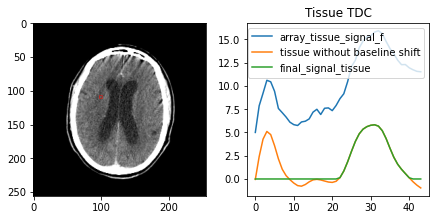

KeyboardInterrupt: 

In [653]:
sys.show_R_signal()

In [114]:
def channel_gradient(mat, degree=1):
    # mat : [time, h, w, 1]
    mat = mat.copy()
    h, w, time = mat.shape
    for j in range(degree):
        time = mat.shape[-1]
        gradient = np.zeros((h, w, time - 1))
        for i in range(1, time):
            gradient[..., i - 1] = mat[..., i] - mat[..., i - 1]
        mat = gradient
    return mat

def dislocation_plus(mat, pluser, sign_mat):
    assert mat.shape[-1] == pluser.shape[-1] + 1
    assert pluser.shape == sign_mat.shape
    h, w, time = mat.shape
    ans = np.zeros_like(mat)
    ans[..., 0] = mat[..., 0]
    for i in range(time - 1):
        ans[..., i + 1] = ans[..., i] + sign_mat[..., i] * pluser[..., i]
    return ans

In [417]:
import torch as t
import torch.nn as nn
from torch import tensor
from torch.autograd import Variable as V
import torch.nn.functional as F
from einops import repeat, rearrange
from torch import optim
import os


def poly_features(x, order=6):
    time, h, w, _ = x.shape
    if not t.is_tensor(x):
        x = t.tensor(x)

    features = t.ones((time, h, w, 1), requires_grad=True)
    for i in range(1, order):
        features = t.cat((features, x ** i), dim=-1)
    return V(features)


def upsample(y, factor):
    # y:[time, h, w, 1]
    if not t.is_tensor(y):
        y = t.tensor(y)
    y = y.unsqueeze(0).permute(0, 4, 1, 2, 3)
    expand_y = F.interpolate(y, scale_factor=(factor, 1, 1), mode='trilinear', align_corners=True)
    expand_y = expand_y.permute(0, 2, 3, 4, 1).squeeze(0)
    print(expand_y.shape)
    return expand_y


class MSE(nn.Module):
    def __init__(self, mask):
        super(MSE, self).__init__()
        if not t.is_tensor(mask):
            mask = t.tensor(mask)

        self.mask = mask
        self.loss = t.nn.MSELoss(reduction='sum')

    def forward(self, y, target):
        print(y.shape, target.shape)
        index = t.where(self.mask != 0)
        #         ans = self.loss(y[index], target[index])
        ans = self.loss(y, target)
        return ans


class AdaptFilter(nn.Module):
    def __init__(self, shape, degree):
        super(AdaptFilter, self).__init__()
        param_shape = (shape) + (degree,)
        self.weight = t.nn.Parameter(t.zeros(param_shape))

    def forward(self, x):
        x = t.sum(input=self.weight * x, dim=-1, keepdims=True)
        return x


def curve_fit(y, mask, degree=6, batch=2, max_epoch=5000, mini_epoch = 1000, lr=0.001, lr_decay=1, factor=2, eps=1e-6, 
              resample=True, blRemoval=False, group_num=10, Device="cuda:1"):
    """
    y: [time, h, w, 1]
    """
    y_label = y.copy()
    time_axis, h, w, _ = y.shape
    if factor > 1:
        if factor % 2 != 0:
            raise ValueError
        y = upsample(y, factor).to(Device).float()
        time_axis = int(factor * time_axis)
        x_axis = t.arange(0, time_axis) / time_axis
        x_input = repeat(x_axis, 'c -> c h w d', h=h, w=w, d=1)
    else:
        x_axis = t.arange(0, time_axis) / time_axis
        x_input = repeat(x_axis, 'c -> c h w d', h=h, w=w, d=1)
        if not t.is_tensor(y):
            y = t.tensor(y).float()

    if not y.is_cuda:
        y = y.float().to(Device)

    if factor > 32 and resample:
        y = subsection(y, mask, group_num).unsqueeze(-1).float().to(Device)
        time_axis = len(y)
        x_axis = t.arange(0, time_axis) / time_axis
        x_input = repeat(x_axis, 'c -> c h w d', h=h, w=w, d=1)

    # ------------ Normalization -------------
    ymin, _ = t.min(y, dim=0)
    ymax, _ = t.max(y, dim=0)
    y = (y - ymin) / (ymax - ymin + eps)
#     if not blRemoval:
#         y = t.exp(y)
    poly_x = poly_features(x_input, degree).float().to(Device)
    adaptFilter = AdaptFilter((h, w), degree).to(Device)

    optimizer = optim.Adam(adaptFilter.parameters(), lr=lr)
    criterion = t.nn.MSELoss(reduction='mean').to(Device)

    scaler = t.cuda.amp.GradScaler()
    losses = []

    poly_x_train = poly_x.clone()
    y_train = y.clone()
    prev_std = t.zeros((1, 256, 256, 1)).to(Device)
    main_peak_index = np.zeros((1, 256, 256, 1))
    main_peak_val = None
    mask = mask.reshape((1, 256, 256, 1))
    eps_mat = t.full((time_axis, 256, 256, 1), eps).to(Device)
    for epoch in tqdm(range(max_epoch)):
        rand_indices = t.randperm(time_axis)
        poly_x_train = poly_x_train[rand_indices]
        y_train = y_train[rand_indices]
        step = 0
        for ii in range(time_axis // batch):
            x_bat = poly_x_train[step: step + batch]
            y_bat = y_train[step: step + batch]
            with t.cuda.amp.autocast():
                y_pred = adaptFilter(x_bat)
                loss = criterion(y_pred, y_bat)
           
            losses.append(loss.item())
            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            
        if blRemoval and epoch != 0 and epoch % (mini_epoch - 1) == 0:
            adaptFilter.eval()
            with t.no_grad():
                predi = t.zeros((time_axis, h, w, 1)).to(Device)
                for tt in range(time_axis):
                    predi[tt : tt + 1, ...] = adaptFilter(poly_x[tt : tt + 1])
                std = t.std((y - predi), axis=0, keepdims=True)

                if epoch == (mini_epoch-1):
                    main_peak_index = (y <= (predi + std)) # [time, h, w, 1], bool
                    main_peak_val = predi[main_peak_index]

                y = t.minimum(y, (predi + std))
                y_train = y
                if main_peak_val is not None:
                    y_train[main_peak_index] = main_peak_val
                    
                condition = t.mean((abs(std - prev_std) / std)[np.where(mask != 0)])
                if condition < 0.01:
                    break
                print(condition)
                prev_std = std
            adaptFilter.train()
        
    adaptFilter.eval()
    time_axis = len(y_label)
    ans = t.zeros((h, w, time_axis)).to(Device)
    eval_x = t.arange(0, time_axis).float() / time_axis
    eval_x = repeat(eval_x, 'c -> c h w d', h=h, w=w, d=1)
    eval_x = poly_features(eval_x, degree).to(Device)
    for tt in range(time_axis):
        ans[..., tt:tt + 1] = adaptFilter(eval_x[tt:tt + 1]).squeeze(0)
    print(loss.item())
    
    y_label = t.tensor(y_label).to(Device).reshape((256, 256, time_axis))
    
#     if not blRemoval:
#         ans = t.log(ans)
    ans = ans * (ymax - ymin) + ymin
    if not blRemoval:
        std_peak = t.max(y_label, axis=-1, keepdims=True)[0] - t.max(ans, axis = -1, keepdims=True)[0]
        ans[t.where(std_peak > 0)] += std_peak[std_peak > 0]
    ans = ans.detach().cpu().numpy()
    return ans, losses


def resample_index(*args):
    num, sample_num = args
#     if num < sample_num:
#         num = sample_num
    if sample_num <= num:
        ans = np.random.choice(int(num), int(sample_num), replace=False)
    else:
        ans = np.random.choice(int(num), int(sample_num), replace=True)
    return t.tensor(ans)


def subsection(mat, mask, group_num=10, Device="cuda:0"):
    if not t.is_tensor(mask):
        mask = t.tensor(mask)
    mat = mat.to(Device)

    time, h, w, _ = mat.shape
    minv = t.min(mat, dim=0)[0]
    maxv = t.max(mat, dim=0)[0]
    step = (((maxv - minv) / group_num) * t.arange(group_num).to(Device)) + minv
    low = step[..., ::2]
    high = step[..., 1::2]
    boaders = t.cat((low.unsqueeze(-1), high.unsqueeze(-1)), dim=-1).permute(-1, -2, 0, 1)
    eps_mat = t.full((1, h, w), 1e-6).to(Device)
    loc_mat = t.zeros((group_num // 2, time, h, w))
    min_loc = t.zeros((group_num // 2, h, w))
    index_mat = t.zeros_like(loc_mat)  # [group_num // 2, time, h, w]
    if mat.shape[-1] == 1:
        mat = mat.squeeze(-1)

    for i in range(group_num // 2):
        condi_left = boaders[0:1, i]
        condi_right = boaders[1:, i]
        loc = t.tensor((mat >= condi_left) * (mat < t.max(condi_right, eps_mat)), dtype=t.float)
        num_sort, index_sort = t.sort(loc, dim=0, descending=True)
        min_loc[i, ...] = t.argmin(num_sort, dim=0)
        index_mat[i] = index_sort
        loc_mat[i] = loc

    sample_num=group_num
    resample_mat = t.zeros((group_num // 2, sample_num, h, w))
    for i in range(group_num // 2):
        temp_min = min_loc[i]
        res = t.zeros((int(sample_num), h, w))
        for j in range(256 * 256):
            row = j // 256
            col = j % 256
            if mask[row, col] == 0:
                continue
            num = temp_min[row, col]
            res[..., row, col] = resample_index(num, sample_num)

        # -------------- Take From Index Sort ---------------------
        resample_mat[i] = res
    sample_loc = t.gather(index_mat, dim=1, index=resample_mat.long()).reshape(-1, 256, 256)
    sample_loc, _ = t.sort(sample_loc, dim=0, descending=False)
    output = t.gather(mat, dim=0, index=sample_loc.long().to(Device))
    return output

In [418]:
t.cuda.empty_cache()

In [419]:
signal_mat = sys.signal_taken.copy().astype('float')
signal_mat = np.expand_dims(signal_mat, axis=0)

In [420]:
mask = sys.brain_mask.copy()
mask.max()

255.0

In [421]:
signal_mat.min(), signal_mat.max()

(-9.804597701149419, 48.84359504132232)

In [422]:
signal_mat = np.swapaxes(signal_mat, 0, -1)
signal_mat.shape

(44, 256, 256, 1)

In [423]:
signal_mat.shape

(44, 256, 256, 1)

In [349]:
start = datetime.datetime.now()
ans, losses = curve_fit(signal_mat, mask, degree=6, batch=32, max_epoch=4000, lr = 0.01, factor=64, group_num=20, resample=True)
end = datetime.datetime.now()
(end - start).seconds

torch.Size([2816, 256, 256, 1])
Sample_num:  40


100%|██████████| 2000/2000 [01:16<00:00, 26.08it/s]


0.0026354286819696426


125

In [431]:
start = datetime.datetime.now()
baseline, losses = curve_fit(signal_mat, mask, degree=6, batch=32, max_epoch=8000, mini_epoch=100, lr = 0.01, factor=2, group_num=20, resample=False, blRemoval=True)
end = datetime.datetime.now()
(end - start).seconds

  0%|          | 0/8000 [00:00<?, ?it/s]

torch.Size([88, 256, 256, 1])


  1%|▏         | 106/8000 [00:02<02:41, 48.79it/s]

tensor(1., device='cuda:1')


  3%|▎         | 201/8000 [00:03<02:21, 55.16it/s]

tensor(0.3519, device='cuda:1')


  4%|▍         | 306/8000 [00:05<02:20, 54.72it/s]

tensor(0.0943, device='cuda:1')


  5%|▌         | 408/8000 [00:07<02:13, 56.68it/s]

tensor(0.0897, device='cuda:1')


  6%|▋         | 510/8000 [00:09<02:14, 55.80it/s]

tensor(0.2354, device='cuda:1')


  8%|▊         | 601/8000 [00:11<02:39, 46.35it/s]

tensor(0.0941, device='cuda:1')


  9%|▉         | 702/8000 [00:13<02:34, 47.36it/s]

tensor(0.0460, device='cuda:1')


 10%|█         | 802/8000 [00:15<02:28, 48.34it/s]

tensor(0.1037, device='cuda:1')


 11%|█         | 897/8000 [00:17<02:36, 45.32it/s]

tensor(0.0767, device='cuda:1')


 12%|█▏        | 998/8000 [00:19<02:24, 48.60it/s]

tensor(0.0472, device='cuda:1')


 14%|█▎        | 1097/8000 [00:20<02:09, 53.39it/s]

tensor(0.0840, device='cuda:1')


 15%|█▌        | 1204/8000 [00:22<01:54, 59.21it/s]

tensor(0.1323, device='cuda:1')


 16%|█▌        | 1292/8000 [00:24<02:22, 47.12it/s]

tensor(0.1423, device='cuda:1')


 17%|█▋        | 1393/8000 [00:26<02:12, 49.80it/s]

tensor(0.1063, device='cuda:1')


 19%|█▊        | 1492/8000 [00:28<02:17, 47.31it/s]

tensor(0.1497, device='cuda:1')


 20%|██        | 1609/8000 [00:29<01:00, 105.72it/s]

tensor(0.0972, device='cuda:1')


 21%|██        | 1695/8000 [00:30<01:21, 76.99it/s] 

tensor(0.0721, device='cuda:1')


 22%|██▏       | 1795/8000 [00:32<01:20, 77.27it/s]

tensor(0.0881, device='cuda:1')


 24%|██▎       | 1882/8000 [00:33<01:19, 76.65it/s] 

tensor(0.1005, device='cuda:1')


 25%|██▍       | 1985/8000 [00:35<01:41, 59.49it/s]

tensor(0.1148, device='cuda:1')


 26%|██▌       | 2090/8000 [00:37<01:46, 55.33it/s]

tensor(0.1505, device='cuda:1')


 27%|██▋       | 2194/8000 [00:39<01:40, 57.73it/s]

tensor(0.0671, device='cuda:1')


 29%|██▊       | 2281/8000 [00:40<02:03, 46.36it/s]

tensor(0.1206, device='cuda:1')


 30%|██▉       | 2384/8000 [00:42<01:52, 49.72it/s]

tensor(0.1355, device='cuda:1')


 31%|███       | 2478/8000 [00:44<01:38, 56.14it/s]

tensor(0.1243, device='cuda:1')


 32%|███▏      | 2581/8000 [00:46<01:47, 50.43it/s]

tensor(0.1457, device='cuda:1')


 34%|███▎      | 2681/8000 [00:48<01:59, 44.64it/s]

tensor(0.0933, device='cuda:1')


 35%|███▍      | 2778/8000 [00:50<01:33, 55.96it/s]

tensor(0.1145, device='cuda:1')


 36%|███▌      | 2878/8000 [00:52<01:30, 56.66it/s]

tensor(0.0748, device='cuda:1')


 37%|███▋      | 2978/8000 [00:54<01:36, 52.06it/s]

tensor(0.1410, device='cuda:1')


 38%|███▊      | 3077/8000 [00:56<01:43, 47.68it/s]

tensor(0.1419, device='cuda:1')


 40%|███▉      | 3174/8000 [00:58<01:43, 46.43it/s]

tensor(0.2470, device='cuda:1')


 41%|████      | 3270/8000 [00:59<01:30, 52.24it/s]

tensor(0.1840, device='cuda:1')


 42%|████▏     | 3372/8000 [01:01<01:21, 56.82it/s]

tensor(0.1743, device='cuda:1')


 43%|████▎     | 3473/8000 [01:03<01:26, 52.25it/s]

tensor(0.2950, device='cuda:1')


 45%|████▍     | 3573/8000 [01:04<00:42, 104.14it/s]

tensor(0.0539, device='cuda:1')


 46%|████▌     | 3666/8000 [01:06<00:52, 82.16it/s] 

tensor(0.2014, device='cuda:1')


 47%|████▋     | 3785/8000 [01:07<00:39, 107.35it/s]

tensor(0.2986, device='cuda:1')


 48%|████▊     | 3876/8000 [01:08<01:04, 63.74it/s] 

tensor(0.1917, device='cuda:1')


 50%|████▉     | 3976/8000 [01:10<01:07, 59.97it/s]

tensor(0.0937, device='cuda:1')


 51%|█████     | 4068/8000 [01:12<01:22, 47.39it/s]

tensor(0.1391, device='cuda:1')


 52%|█████▏    | 4166/8000 [01:14<01:19, 47.99it/s]

tensor(0.1081, device='cuda:1')


 53%|█████▎    | 4260/8000 [01:16<01:06, 56.27it/s]

tensor(0.0879, device='cuda:1')


 55%|█████▍    | 4372/8000 [01:18<01:00, 59.63it/s]

tensor(0.0672, device='cuda:1')


 56%|█████▌    | 4464/8000 [01:19<01:14, 47.77it/s]

tensor(0.0703, device='cuda:1')


 57%|█████▋    | 4562/8000 [01:21<01:08, 50.33it/s]

tensor(0.0507, device='cuda:1')


 58%|█████▊    | 4660/8000 [01:23<01:10, 47.23it/s]

tensor(0.0995, device='cuda:1')


 59%|█████▉    | 4759/8000 [01:25<01:06, 48.82it/s]

tensor(0.1767, device='cuda:1')


 61%|██████    | 4858/8000 [01:27<01:04, 48.45it/s]

tensor(0.0838, device='cuda:1')


 62%|██████▏   | 4957/8000 [01:29<01:03, 47.99it/s]

tensor(0.0918, device='cuda:1')


 63%|██████▎   | 5057/8000 [01:31<01:01, 47.70it/s]

tensor(0.0483, device='cuda:1')


 64%|██████▍   | 5158/8000 [01:33<00:52, 54.33it/s]

tensor(0.0238, device='cuda:1')


 66%|██████▌   | 5261/8000 [01:35<00:49, 54.97it/s]

tensor(0.1301, device='cuda:1')


 67%|██████▋   | 5353/8000 [01:36<00:54, 48.73it/s]

tensor(0.1721, device='cuda:1')


 68%|██████▊   | 5452/8000 [01:38<00:56, 45.38it/s]

tensor(0.0393, device='cuda:1')


 70%|██████▉   | 5561/8000 [01:40<00:23, 102.87it/s]

tensor(0.0934, device='cuda:1')


 71%|███████   | 5654/8000 [01:41<00:32, 72.47it/s] 

tensor(0.2043, device='cuda:1')


 72%|███████▏  | 5749/8000 [01:42<00:23, 96.84it/s]

tensor(0.0726, device='cuda:1')


 73%|███████▎  | 5837/8000 [01:43<00:21, 100.25it/s]

tensor(0.1133, device='cuda:1')


 74%|███████▍  | 5950/8000 [01:45<00:37, 54.91it/s] 

tensor(0.0715, device='cuda:1')


 76%|███████▌  | 6046/8000 [01:47<00:39, 50.08it/s]

tensor(0.0584, device='cuda:1')


 77%|███████▋  | 6149/8000 [01:49<00:37, 49.38it/s]

tensor(0.1866, device='cuda:1')


 78%|███████▊  | 6244/8000 [01:51<00:38, 45.94it/s]

tensor(0.1332, device='cuda:1')


 79%|███████▉  | 6343/8000 [01:53<00:34, 48.01it/s]

tensor(0.2825, device='cuda:1')


 81%|████████  | 6442/8000 [01:55<00:32, 47.81it/s]

tensor(0.0582, device='cuda:1')


 82%|████████▏ | 6543/8000 [01:57<00:31, 46.41it/s]

tensor(0.1124, device='cuda:1')


 83%|████████▎ | 6641/8000 [01:58<00:24, 55.36it/s]

tensor(0.0704, device='cuda:1')


 84%|████████▍ | 6739/8000 [02:00<00:25, 49.22it/s]

tensor(0.1582, device='cuda:1')


 85%|████████▌ | 6838/8000 [02:02<00:23, 49.34it/s]

tensor(0.2802, device='cuda:1')


 87%|████████▋ | 6938/8000 [02:04<00:22, 48.18it/s]

tensor(0.2046, device='cuda:1')


 88%|████████▊ | 7036/8000 [02:06<00:19, 48.22it/s]

tensor(0.0544, device='cuda:1')


 89%|████████▉ | 7136/8000 [02:08<00:18, 46.89it/s]

tensor(0.0500, device='cuda:1')


 90%|█████████ | 7234/8000 [02:10<00:17, 44.71it/s]

tensor(0.2861, device='cuda:1')


 92%|█████████▏| 7333/8000 [02:12<00:14, 45.17it/s]

tensor(0.0605, device='cuda:1')


 93%|█████████▎| 7428/8000 [02:14<00:11, 49.08it/s]

tensor(0.1350, device='cuda:1')


 94%|█████████▍| 7547/8000 [02:15<00:03, 135.81it/s]

tensor(0.1351, device='cuda:1')


 95%|█████████▌| 7636/8000 [02:15<00:02, 131.43it/s]

tensor(0.1920, device='cuda:1')


 97%|█████████▋| 7734/8000 [02:16<00:02, 94.76it/s] 

tensor(0.2536, device='cuda:1')


 98%|█████████▊| 7847/8000 [02:17<00:01, 142.31it/s]

tensor(0.2534, device='cuda:1')


 99%|█████████▉| 7933/8000 [02:18<00:00, 119.48it/s]

tensor(0.0562, device='cuda:1')


100%|██████████| 8000/8000 [02:19<00:00, 57.46it/s] 


0.007826143875718117


139

In [360]:
ans_ = np.expand_dims(np.swapaxes(ans, 0, -1), axis=-1)
ans_.shape

(44, 256, 256, 1)

In [366]:
start = datetime.datetime.now()
ans_baseline, _ = curve_fit(ans_, mask, degree=4, batch=32, max_epoch=2000, mini_epoch=50, lr = 0.01, factor=64, group_num=20, resample=True, blRemoval=True)
end = datetime.datetime.now()
(end - start).seconds

torch.Size([704, 256, 256, 1])


100%|██████████| 2000/2000 [04:23<00:00,  7.58it/s]

0.02527005225419998


265

In [370]:
signal_mat_ = signal_mat - np.expand_dims(np.swapaxes(baseline, 0, -1), axis=-1)
signal_mat_.shape

(44, 256, 256, 1)

In [373]:
start = datetime.datetime.now()
ans_, _ = curve_fit(signal_mat_, mask, degree=6, batch=32, max_epoch=2000, mini_epoch=500, lr = 0.01, factor=16, group_num=20, resample=False, blRemoval=False)
end = datetime.datetime.now()
(end - start).seconds

torch.Size([704, 256, 256, 1])


100%|██████████| 2000/2000 [04:17<00:00,  7.78it/s]


0.003161141648888588


258

In [395]:
baseline = np.minimum(baseline, sys.signal_taken)
baseline.shape

(256, 256, 44)

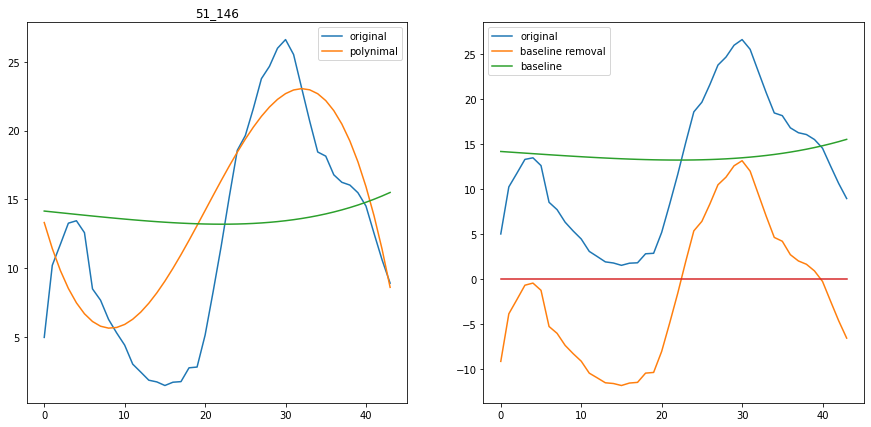

In [ ]:
for i in range(100 * 100, 256 * 256):
    row = i//256
    col = i % 256
    if sys.brain_mask[row, col] == 0:
        continue
    ori_signal = sys.signal_taken[row, col,...]
    curve = ans[row, col]
    plt.figure(figsize=(15, 7))
    display.clear_output(wait = True)
    plt.subplot(1, 2, 1)
#     plt.plot(np.arange(len(signal_plus)),signal_plus, label='simulation')
    plt.plot(np.arange(len(ori_signal)),ori_signal, label='original')
    plt.plot(np.arange(len(curve)), curve, label='polynimal')
    plt.plot(baseline[row, col])
    plt.legend()
    plt.title("{}_{}".format(row, col))
    plt.subplot(1, 2, 2)
    plt.plot(ori_signal, label='original')
    plt.plot(ori_signal - baseline[row, col], label='baseline removal')
    plt.plot(baseline[row, col], label='baseline')
    plt.plot(np.zeros(len(curve)))
#     plt.plot(ans_[row, col])
    plt.legend()
    plt.show()
    plt.pause(1)
    plt.close()

44

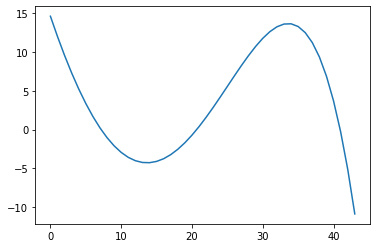

In [457]:
plt.figure()
plt.plot(base_signal)
plt.show()

torch.Size([1408, 256, 256, 1])
torch.Size([1408, 256, 256, 1])


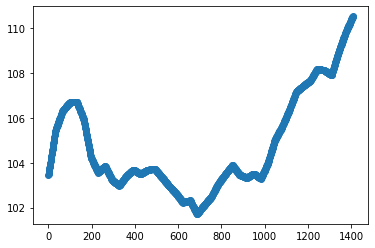

In [34]:
expand_signal = upsample(signal_mat, 32)
print(expand_signal.shape) 
signal_show = expand_signal[..., row, col, 0]
time_axis = np.arange(len(signal_show))
plt.figure()
plt.scatter(time_axis, expand_signal[..., row, col, 0])
plt.show()


In [164]:
signal = expand_signal[..., row, col, 0].numpy()

In [123]:
def poly_features(time, order= 6):
    x = np.arange(time)
    features = np.ones((time,))
    for i in range(1, order):
        features = np.dstack((features, x**i))
    return features
x = poly_features(88)
x.shape

(1, 88, 6)

In [65]:
from sklearn.svm import SVR as svr
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
# x = x.reshape(-1, 6)
x = np.arange(len(signal)).reshape(-1, 1)
y = signal.reshape(-1, )
model = svr(kernel = 'rbf', degree = 6)
regr = make_pipeline(StandardScaler(), model)
regr.fit(x, y)

Pipeline(steps=[('standardscaler', StandardScaler()), ('svr', SVR(degree=6))])

In [66]:
out = model.fit(x, y)

In [67]:
pred = out.predict(x)
pred.shape

(140,)

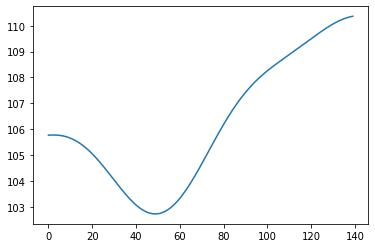

In [68]:
plt.figure()
plt.plot(pred)
plt.show()

In [143]:
minv = signal.min()
maxv = signal.max()
groups = np.linspace(minv, maxv, 10)
groups, groups[::2], groups[1::2]

(array([ 93.43877551,  95.37526604,  97.31175657,  99.2482471 ,
        101.18473763, 103.12122816, 105.0577187 , 106.99420923,
        108.93069976, 110.86719029]),
 array([ 93.43877551,  97.31175657, 101.18473763, 105.0577187 ,
        108.93069976]),
 array([ 95.37526604,  99.2482471 , 103.12122816, 106.99420923,
        110.86719029]))

In [144]:
condList = np.dstack((groups[::2], groups[1::2]))
condList = condList.squeeze(0)
condList.shape, condList[0].shape

((5, 2), (2,))

In [145]:
samples = []
samples_loc = []
for boader in condList:
    samples.append(signal[np.argwhere(np.logical_and(signal >= boader[0], signal < boader[1]))])
    samples_loc.append(np.argwhere(np.logical_and(signal >= boader[0], signal < boader[1])))
#     print(signal[np.argwhere(np.logical_and(signal >= boader[0], signal < boader[1]))])

In [146]:
counters = []
for group in samples:
    counters.append(len(group))

In [147]:
counters, condList

([254, 32, 103, 81, 218],
 array([[ 93.43877551,  95.37526604],
        [ 97.31175657,  99.2482471 ],
        [101.18473763, 103.12122816],
        [105.0577187 , 106.99420923],
        [108.93069976, 110.86719029]]))

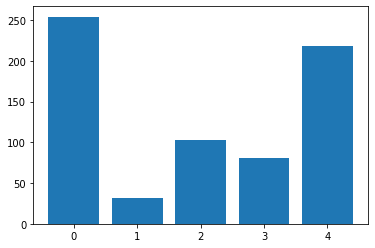

In [148]:
plt.figure()
plt.bar(np.arange(5), counters)
plt.show()

In [149]:
for num in counters:
    print(num, num / sum(counters))

254 0.3691860465116279
32 0.046511627906976744
103 0.14970930232558138
81 0.11773255813953488
218 0.3168604651162791


In [165]:
indexes = []
for loc in samples_loc:
    indexes += (np.random.choice(loc.squeeze(-1), 30)).tolist()
indexes.sort()

In [166]:
signal_taken = signal[indexes]

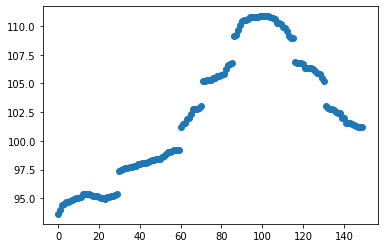

In [168]:
plt.figure()
plt.scatter(np.arange(len(signal_taken)), signal_taken)
plt.show()

In [169]:
from scipy.stats import pearsonr
from tqdm import tqdm
import pdb
def last_square_current_loss(xs, ys, A):
    error = 0.0
    for i in range(len(xs)):
        y1 = 0.0
        for k in range(len(A)):
            y1 += A[k] * xs[i]**k
        error += (ys[i] - y1) ** 2
    return error


def create_Polyfeatures(x, order = 6):
    time, w, h, f = x.shape
    features = np.ones((time, w, h, 1))
    for i in range(1, 6):
        features = np.concatenate((features, x**i), axis=-1)
    return features

def last_square_fit_curve_Gradient(xs, ys, order, iternum=1000, learn_rate=0.001):
    '''
    xs:[256, 256, time]
    ys:[256, 256, time]
    order:6
    '''
    A = [0.0] * (order + 1)
    for r in range(iternum + 1):
        for k in range(len(A)):
            gradient = 0.0
            for i in range(len(xs)):
                y1 = 0.0
                for j in range(len(A)):
                    y1 += A[j] * xs[i]**j
                gradient += -2 * (ys[i] - y1) * xs[i]**k 
            A[k] = A[k] - (learn_rate * gradient)  
        if r % 100 == 0:
            error = last_square_current_loss(xs=xs, ys=ys, A=A)
    return A

def draw_fit_curve(xs, ys, A, order):
    fig = plt.figure()
    ax = fig.add_subplot(111)
    fit_xs, fit_ys = np.arange(-1, 1, 0.01), []
    for i in range(0, len(fit_xs)):
        y = 0.0
        for k in range(0, order + 1):
            print(k)
            y += (A[k] * fit_xs[i] ** k)
        fit_ys.append(y)
    ax.scatter(fit_xs, fit_ys, color='g')
    ax.plot(xs, ys, color='m', linestyle='', marker='.')
    plt.show()

In [170]:
def func(weight, x):
    a1, a2, a3, a4, a5, a6 = weight[:,...]
    return a1*(x**5) + a2*(x**4) + a3*(x**3) + a4*(x**2) + a5*(x) + a6

def error(p, x, y):
    return (func(p, x) - y)**2

In [174]:
from scipy.optimize import curve_fit, leastsq
x = np.arange(len(signal_taken))
y = signal_taken
p0 = np.zeros((6,))
x.shape, y.shape
param = leastsq(error, p0, args=(x, y))
show_signal = func(param[0], x)


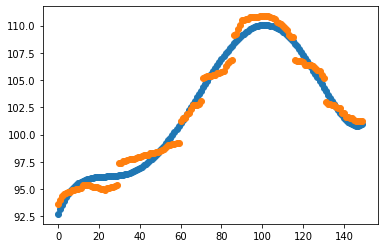

In [176]:
plt.figure()
plt.scatter(np.arange(len(show_signal)) ,show_signal)
plt.scatter(np.arange(len(signal_taken)), signal_taken)
plt.show()

In [73]:
base_signal = BaselineRemoval(pred).IModPoly(2)
base_signal_split = BaselineRemoval(show_signal).IModPoly(2)

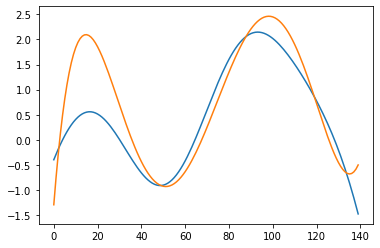

In [74]:
plt.figure()
plt.plot(base_signal)
plt.plot(base_signal_split)
plt.show()

In [295]:
len(signal), len(show_signal)

(425, 425)

In [ ]:
hist = []
for i in range(len(signal) / 25)
    hist = len()

<AxesSubplot:ylabel='Density'>

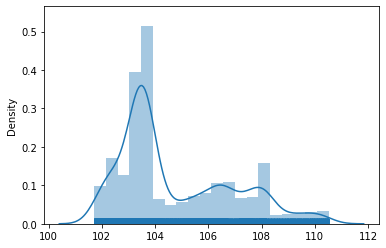

In [86]:
import seaborn as sns

# signal = expand_signal[..., row, col, 0]
sns.distplot(signal, rug=True)

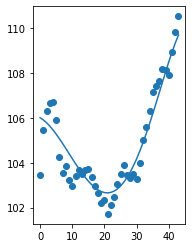

In [28]:
plt.figure()
plt.subplot(1, 2, 1)
plt.scatter(np.arange(44), ori_signal)
plt.plot(np.arange(44), curve[::32])
plt.show()

In [84]:
condList

array([[101.71977381, 102.69750869],
       [103.67524357, 104.65297846],
       [105.63071334, 106.60844822],
       [107.58618311, 108.56391799],
       [109.54165287, 110.51938776]])

In [846]:
row, col

(103, 96)

In [478]:
def find_bbox(mask):
    """
    :param mask:Ground Truth
    :return: [left_bottom_y, left_bottom_x, height, width]
    """
    _, labels, stats, centroids = cv2.connectedComponentsWithStats(mask.astype(np.uint8))
    stats = stats[stats[:, 4].argsort()]
    return stats[:-1]

def generator_bbox(mask, mode='box', expFactor=1):
    """
    :param mask:
    :param mode: 'center' or 'box'
    :param expFactor: expand the height,width of the anchor box for easier semantic segmentation
    :return: [left_bottom_y, left_bottom_x, right_top_y, right_top_x] or [cnt_y, cnt_x, height, width]
    """
    if mode not in ['center', 'box']:
        raise ValueError

    if mask.shape[0] == 1:
        mask = mask.squeeze(0)

    bbox = find_bbox(mask)
    ans = np.zeros((len(bbox), 4))
    for idx, box in enumerate(bbox):
        ymin = box[0] - 1
        xmin = box[1] - 1
        height = box[2] + 1
        width = box[3] + 1

        if expFactor != 1:
            cnt_y = ymin + height / 2
            cnt_x = xmin + width / 2
            height = expFactor * height
            width = expFactor * width
            ymin = cnt_y - height / 2
            xmin = cnt_x - width / 2

        if mode == 'center':
            ans[idx, :] = [ymin + height / 2, xmin + width / 2, height, width]
        else:
            ans[idx, :] = [ymin + height, xmin, ymin, xmin + width]
    return ans

def bbox2show(bbox, mode='center'):
    """
    :param bbox:[num, 4]
    :param mode: 'center' or 'box'
    :return: center:[cnt_y, cnt_x, height, width] -> [ymin, xmin, height, width] 
        or box:[ymax, xmin, ymin, xmax] -> [ymin, xmin, height, width]
    """
    if mode not in ['center', 'box']:
        raise ValueError

    if isinstance(bbox, list):
        bbox = np.array(bbox)

    ans = np.zeros((len(bbox), 4))
    for idx, box in enumerate(bbox):
        if mode == 'center':
            cnt_y, cnt_x = box[:2]
            height, width = box[2:]
            ans[idx, :] = [int(cnt_y - height / 2), int(cnt_x - width / 2), height, width]
        else:
            ymax, xmin = box[:2]
            ymin, xmax = box[2:]
            height = ymax - ymin
            width = xmax - xmin
            ans[idx, :] = [ymin, xmin, height, width]
    return ans

In [392]:
def add_box(img, mask):
    bbox = generator_bbox(mask, mode='box', expFactor=1)
    for box in bbox:
        print(box)
        cv2.rectangle(img, (box[0], box[1]), (box[2], box[3]), (255,23,13), 1)
    return img

In [393]:
def RGBMapping(img, aif_mask, vessel_mask):
    if len(img.shape) > 2 and img.shape[-1] != 3:
        raise ValueError
    rgb = img.copy().astype('uint8')
    if len(rgb.shape) == 2:
        rgb = cv2.cvtColor(rgb, cv2.COLOR_GRAY2BGR)
    rgb[..., 0][vessel_mask == 1] = 255
    rgb[..., 0][aif_mask == 1] = 255
    rgb[..., 1][vessel_mask == 1] = 255
    rgb[..., 1][aif_mask == 1] = 48
    rgb[..., 2][vessel_mask == 1] = 0
    rgb[..., 2][aif_mask == 1] = 48
    return rgb

def creatVideo(imgs, aif_threshold, vessel_threshold, vessel_location):
    print(aif_threshold, vessel_threshold)
    ans = np.zeros(imgs.shape + (3, )).astype('uint8')
    for i in range(len(imgs)):
        img = imgs[i].copy() / 255
        vessel_idx = np.where(vessel_location != 0)
        vessel_seq = img[vessel_idx]
        vessel_fill = np.zeros_like(vessel_seq)
        vessel_fill[np.where(vessel_seq > vessel_threshold)] = 1
        vessel_mask = np.zeros_like(img)
        vessel_mask[vessel_idx] = vessel_fill

        aif_mask = np.zeros_like(img)
        aif_idx = np.where(vessel_mask == 1)
        aif_seq = img[aif_idx]
        aif_fill = np.zeros_like(aif_seq)
        aif_fill[np.where(aif_seq > aif_threshold)] = 1
        aif_mask[aif_idx] = aif_fill
        rgb = RGBMapping(img * 255, aif_mask, vessel_mask)
        ans[i, ...] = rgb
    return ans

def add_box(img, mask):
    bbox = generator_bbox(mask, mode='box', expFactor=1.5).astype('int')
    for box in bbox:
        cv2.rectangle(img, (box[0], box[1]), (box[2], box[3]), (184,134,11), 1)
    return img

def saveVideo(video, name, path, timepoint, mask):
    size = len(video)
    path = os.path.join(path, '{}.avi'.format(name))
    videoWriter = cv2.VideoWriter(path, cv2.VideoWriter_fourcc(*'MJPG'), size, Img_shape)
    for i in range(len(video)):
        img = video[i]
        if i == timepoint:
            img = add_box(img, mask)
        videoWriter.write(img)
    return

In [650]:
def param_mapping(param, mask, mode = 'less'):
    mask_idx = np.where(mask != 0)
    if param.shape[-1] == 1:
        param = param.squeeze(-1)
    param_seq = param[mask_idx]
    condition = modeNum(param, mode='mean')
    if mode == 'less':
        param_idx = np.where(param_seq < condition)
    elif mode == 'big':
        param_idx = np.where(param_seq > condition)
    else:
        raise ValueError
        
    seq_copy = np.zeros_like(param_seq)
    seq_copy[param_idx] = 1
    param_img = np.zeros_like(mask)
    param_img[mask_idx] = seq_copy
    return param_img

def normalization(param_map):
    minest = np.min(param_map, axis = (0, 1))
    maxest = np.max(param_map, axis = (0, 1))
    param_norm = param_map / (maxest - minest) 
    return param_norm

def otsu(param):
    output = param.copy()
    threshold = filters.threshold_otsu(param[param!=0])
    output[param < threshold] = 0
    return output


def vessel_location_condition(param_norm, mask):
    region = 2 * param_norm[..., 2] - np.sum(param_norm, axis=-1)
    region[mask!=0] = np.exp(region[mask!=0]) 
    plt.figure()
    plt.imshow(region)
    plt.show()
    vessel_region = otsu(region)
    vessel_region[vessel_region!=0] = 1
    plt.figure()
    plt.imshow(vessel_region)
    plt.show()
    return vessel_region


In [899]:
import skimage
from collections import Counter
from scipy import stats
Img_shape = (256, 256)
def ttp_mapping(tissue_signal):
    ttp = np.argmax(tissue_signal, axis=-1)
    return np.expand_dims(ttp, axis=-1)


def cbf_mapping(tissue_signal):
    cbf = np.max(tissue_signal, axis=-1)
    cbf = np.expand_dims(cbf, axis=-1)
    return cbf


def halfRadius_mapping(tissue_signal, cbf_map):
    half_cbf = cbf_map / 2
    radius = np.sum(tissue_signal > half_cbf, axis=-1)
    radius = np.expand_dims(radius, axis=-1)
    return radius


def bat_mapping(tissue_signal):
    shape = Img_shape
    bat = np.zeros(shape + (1,))
    end = np.zeros_like(bat)
    for i in range(shape[0] * shape[1]):
        y = int(i // shape[0])
        x = int(i % shape[1])
        idx = np.argwhere(tissue_signal[y, x, :] > 0)
        if len(idx) > 0:
            bat[y, x, :] = idx.min()
            end[y, x, :] = idx.max()
    return bat, end

def computeMode(para_map, mask):
    para_map_ = para_map[mask != 0]
    mode = stats.mode(para_map_)[0][0]
    return mode


def vessel_locating_kmeans(param_map, mask):
    #(bat, radius, cbf, ttp, end)
    mask_idx = np.where(mask != 0)
    param_norm = normalization(param_map)
    # --------------Label Selection----------------------
    region = param_norm[..., 2] - param_norm[..., 3] 
    region[mask_idx] = np.exp(region[mask_idx]) 
    union = otsu(region)
    union[union!=0] = 1
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(region)
    plt.subplot(1, 2, 2)
    plt.imshow(union)
    plt.show()
    # --------------Normalization----------------
    shape = Img_shape
    x_seq = param_norm[mask_idx]
    predi = Kmeans(x_seq, cluster=2)
    label_map = predi.labels_ + 1
    label_seq = label_map[union[mask_idx] == 1]
    label = stats.mode(label_seq)[0][0]
    # ----------------label --------------------------
#     label = stats.mode(label_map)[0][0]
    fill = np.zeros_like(label_map)
    fill[np.where(label_map == label)] = 1
    location = np.zeros(shape)
    location[mask_idx] = fill
    return location


def modeNum(param_map, mode='mean'):
    mode = mode.lower()
    if mode == 'mean':
        method = np.mean
    elif mode == 'max':
        method = np.max
    elif mode == 'min':
        method = np.min
    elif mode == 'median':
        method = np.median
    elif mode == 'mode':
        method = lambda x: np.argmax(np.bincount(x.astype('int')))
    else:
        raise ValueError

    param_map = param_map.copy()
    ans = method(param_map[np.where(param_map != 0)])
    return ans

def Kmeans(seq, num_f = 1, cluster = 2):
    seq =seq.reshape(-1, seq.shape[-1])
    y_pred = kmeans(n_clusters = cluster, init = 'k-means++', n_jobs = -1, precompute_distances=True).fit(seq)
    return y_pred

def openOperation(mask, erod_w = 2, dilation_w = 2):
    dilation_kernal = skimage.morphology.square(dilation_w)
    erod_kernel = skimage.morphology.square(erod_w)
    erod = skimage.morphology.erosion(mask, erod_kernel)
    dilation = skimage.morphology.dilation(erod, dilation_kernal)
    return dilation


def aif_filter(aif_mask, param_norm, outputNum = 6):
    #bat, radius, cbf, ttp, end
    sort_conditions = np.sum(param_norm, axis=-1) - 2 * param_norm[..., 2]
    aif_mask = openOperation(aif_mask, 2, 2)
    label_image = label(aif_mask, connectivity=aif_mask.ndim)
    props = regionprops(label_image)
    priQue = []
    for i in range(len(props)):
        row, col = props[i].centroid
        ymax = int(row + 1)
        ymin = int(row - 1)
        xmax = int(col + 1)
        xmin = int(col - 1)
        priQue.append(np.sum(sort_conditions[ymin:ymax + 1, xmin:xmax + 1]) / 9)
    sortIdx = np.argsort(np.array(priQue))
    props = np.array(props)
    props = props[sortIdx]
    output = np.zeros_like(aif_mask)
    for i in range(min(outputNum, len(props))):
        row, col = props[i].centroid
        ymax = int(row + 1)
        ymin = int(row - 1)
        xmax = int(col + 1)
        xmin = int(col - 1)
        output[ymin:ymax + 1, xmin:xmax + 1] = 1
    return output


def aifDetection_Kmeans(tissue_signal, images, mask):
    ttp = ttp_mapping(tissue_signal)
    cbf = cbf_mapping(tissue_signal)
    radius = halfRadius_mapping(tissue_signal, cbf)
    bat, end = bat_mapping(tissue_signal)
    param_map = np.concatenate((bat, radius, cbf, ttp, end), axis=-1)
    param_norm = normalization(param_map)
    vel_location = vessel_locating_kmeans(param_norm, mask)

     # -----------------Vessel Mask---------------------------
    idx = modeNum(ttp, mode='median')
    idx = int(idx)
    Image = images[idx].copy() / 255
    vessel_location_idx = np.where(vel_location != 0)    
    vessel_seq = Image[vessel_location_idx]
    vessel_seq = np.expand_dims(vessel_seq, axis=0)
    vessel_threshold = filters.threshold_otsu(vessel_seq)
    vessel_mask = np.zeros_like(vel_location)
    vessel_fill = np.zeros_like(vessel_seq)
    vessel_fill[np.where(vessel_seq > vessel_threshold)] = 1
    vessel_mask[vessel_location_idx] = vessel_fill.squeeze(0)
    
    
    aif_seq = Image[np.where(vessel_mask != 0)]
    aif_seq = np.expand_dims(aif_seq, axis = 0)
    aif_threshold = filters.threshold_otsu(aif_seq)
    aif_fill = np.zeros_like(aif_seq)
    aif_fill[np.where(aif_seq > aif_threshold)] = 1
    aif_location = np.zeros_like(vel_location)
    aif_location[np.where(vessel_mask!=0)] = aif_fill
    
    # ---------------Aif Mask----------------------
    Image = images[idx].copy() / 255
    ttp_mask = creat_mask(Image, aif_location, aif_threshold)
    
    idx = (modeNum(ttp, mode='median') + modeNum(bat, mode='median')) // 2
    idx = int(idx)
    Image = images[idx].copy() / 255
    aif_mask = creat_mask(Image, aif_location, aif_threshold)
    aif_mask[ttp_mask == 1] = 1
    aif_mask = aif_filter(aif_mask, param_norm, 10)
    return aif_location, aif_mask, vel_location, vessel_threshold, aif_threshold, idx 

def creat_mask(Image, location, threshold):
    location_idx = np.where(location == 1)
    img_seq = Image[location_idx]
    output_mask = np.zeros_like(Image)
    fill = np.zeros_like(img_seq)
    fill[np.where(img_seq > threshold)] = 1
    output_mask[location_idx] = fill
    return output_mask

In [900]:
def aifDetection_Condition(tissue_signal, images, mask):
    
    ttp = ttp_mapping(tissue_signal)
    cbf = cbf_mapping(tissue_signal)
    radius = halfRadius_mapping(tissue_signal, cbf)
    bat, end = bat_mapping(tissue_signal)
    param_map = np.concatenate((bat, radius, cbf, ttp, end), axis=-1)
    param_norm = normalization(param_map)
    vessel_mask = vessel_location_condition(param_norm, mask)
    
    idx = modeNum(ttp, mode='median')
    idx = int(idx)
    Image = images[idx].copy() / 255
    vessel_threshold = np.mean(Image[vessel_mask != 0])
    aif_location_idx = np.where(vessel_mask == 1)
    aif_seq = Image[aif_location_idx]
    
    aif_seq = np.expand_dims(aif_seq, axis=0)
    aif_threshold = filters.threshold_otsu(aif_seq)
    aif_location = np.zeros_like(vessel_mask)
    
    aif_fill = np.zeros_like(aif_seq)
    aif_fill[np.where(aif_seq > aif_threshold)] = 1
    aif_location[aif_location_idx] = aif_fill.squeeze(0)
    
    # -----------------Create Mask---------------------
    Image = images[idx].copy() / 255
    ttp_mask = creat_mask(Image, aif_location, aif_threshold)
    idx = (modeNum(ttp, mode='median') + modeNum(bat, mode='median')) // 2
    idx = int(idx)
    Image = images[idx].copy() / 255
    aif_mask = creat_mask(Image, aif_location, aif_threshold)
    aif_mask[ttp_mask == 1] = 1
    
    ttp = ttp_mapping(tissue_signal)
    cbf = cbf_mapping(tissue_signal)
    radius = halfRadius_mapping(tissue_signal, cbf)
    bat, end = bat_mapping(tissue_signal)
    param_map = np.concatenate((bat, radius, cbf, ttp, end), axis=-1)
    
    aif_mask = aif_filter(aif_mask, param_map, 10)
    return aif_location, aif_mask, vessel_threshold, aif_threshold, idx 

In [928]:
imgs = sys.images.copy()
tissue_signal = sys.tissue_signal.copy()
mask = sys.brain_mask.copy()

In [929]:
global_all, timepoint

('11_case_15_4', 22)

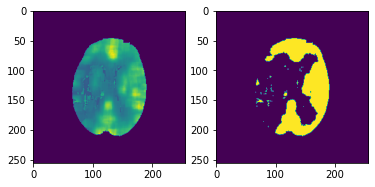

Time: 3s


In [930]:
# --------------------Kmeans-------------------------
import time
start = datetime.datetime.now()
vessel_mask, aif_mask, vel_location,vessel_threshold, aif_threshold, timepoint = aifDetection_Kmeans(tissue_signal, imgs, mask)
end = datetime.datetime.now()
print('Time: {}s'.format((end - start).seconds))

(256, 256)


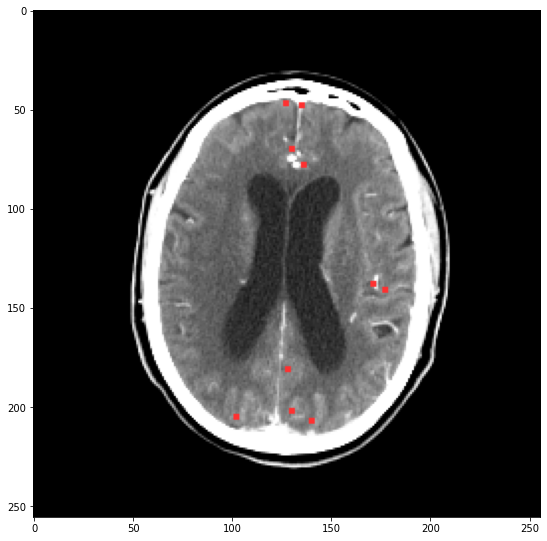

In [931]:
print(vel_location.shape)
plt.figure(figsize = (20, 15))
plt.subplot(1, 2, 1)
plt.imshow(RGBMapping(imgs[timepoint], aif_mask, aif_mask))
# plt.subplot(1, 2, 2)
# plt.imshow(vel_location)
# plt.show()

0.5502895220588235 0.41349264705882355


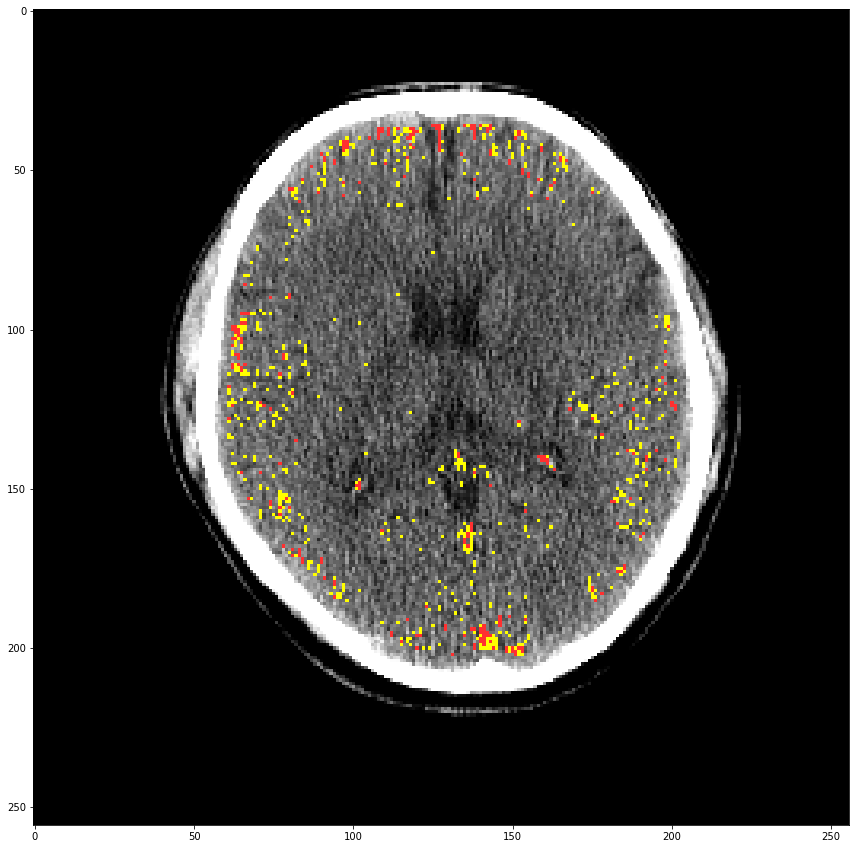

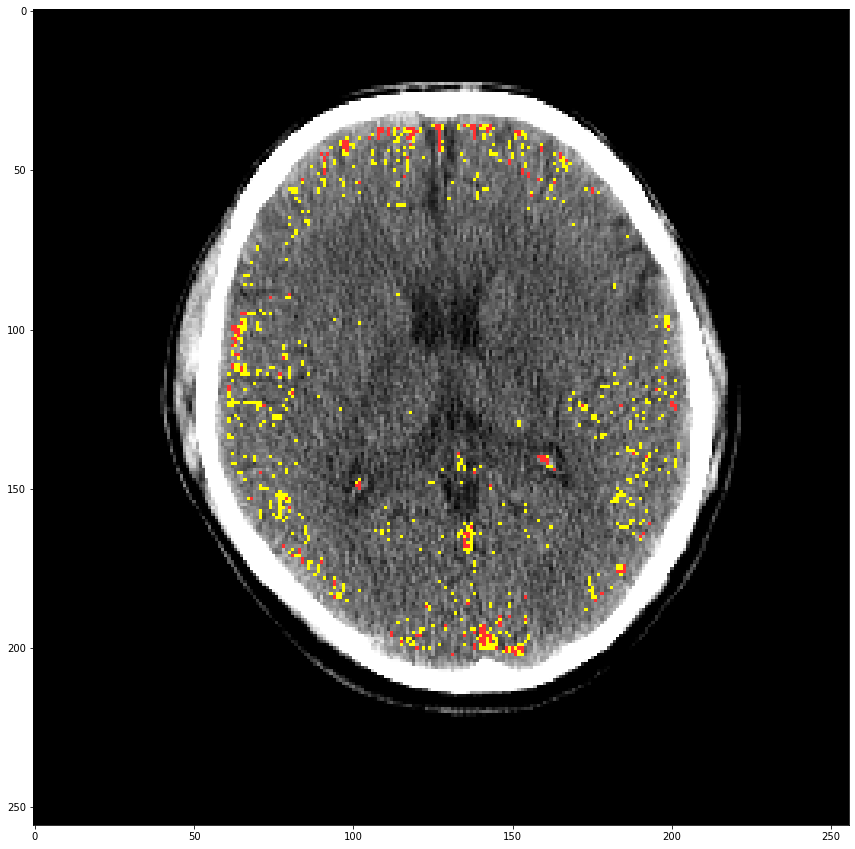

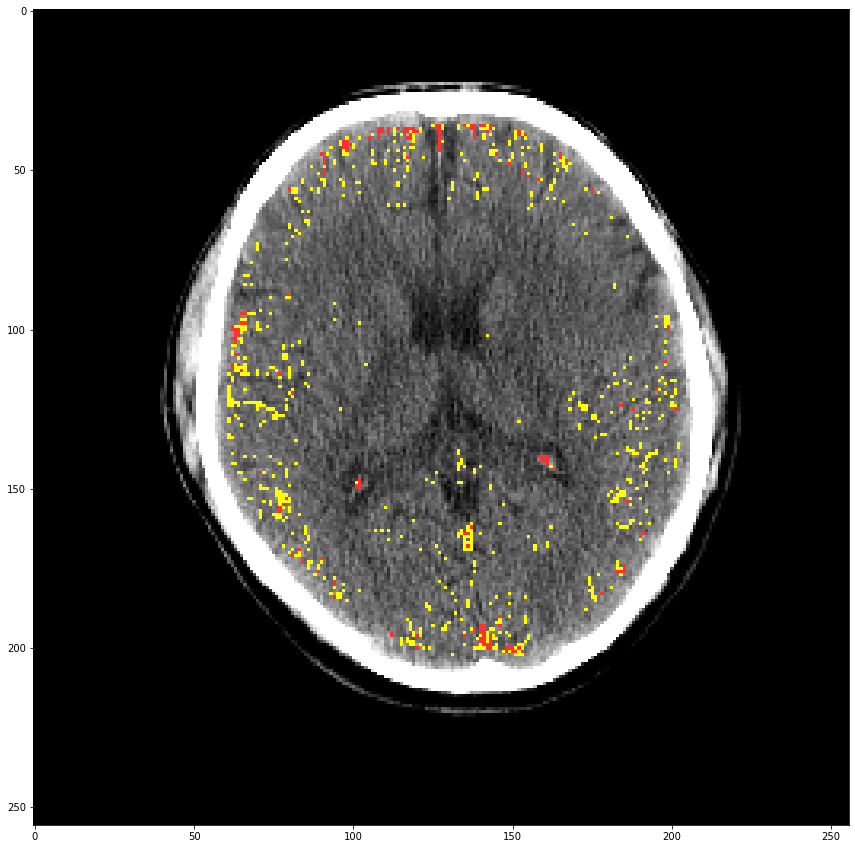

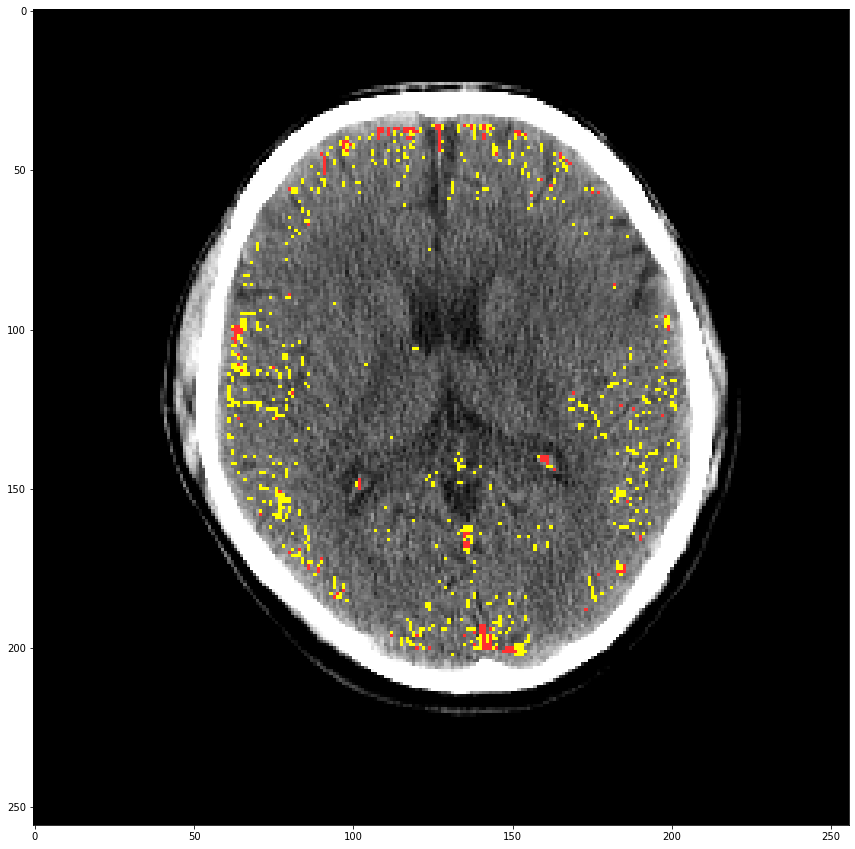

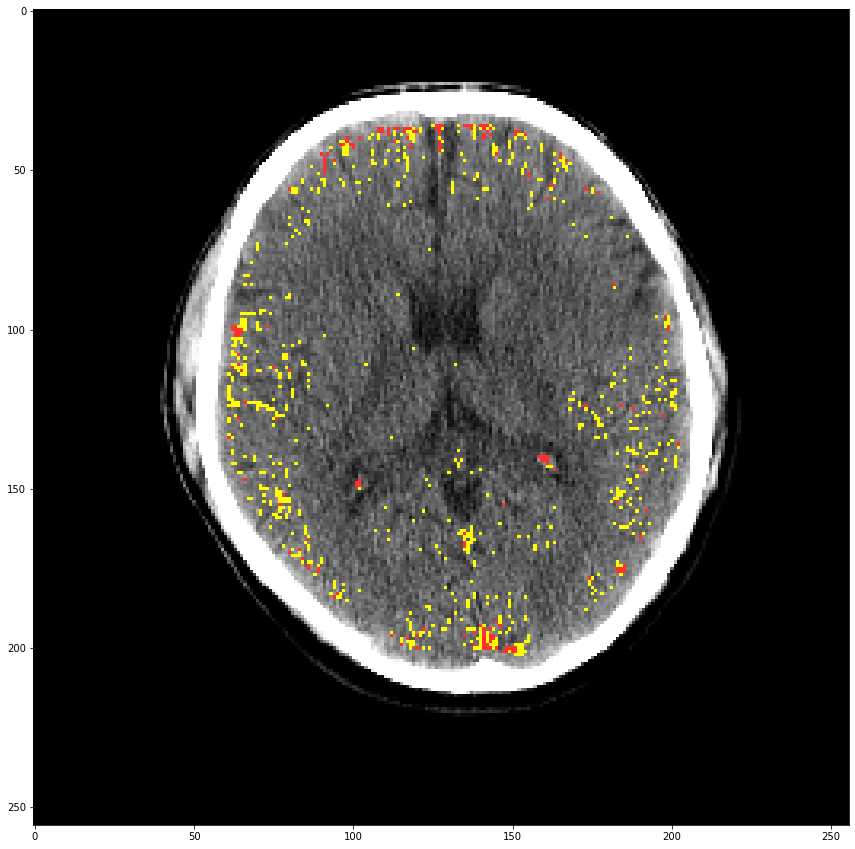

...

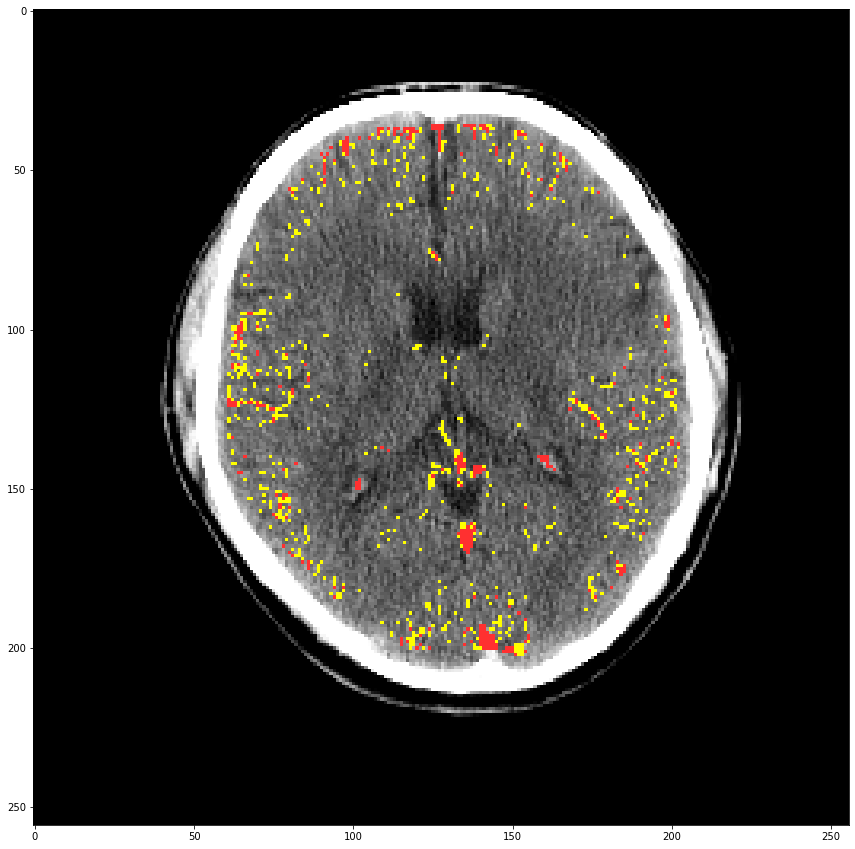

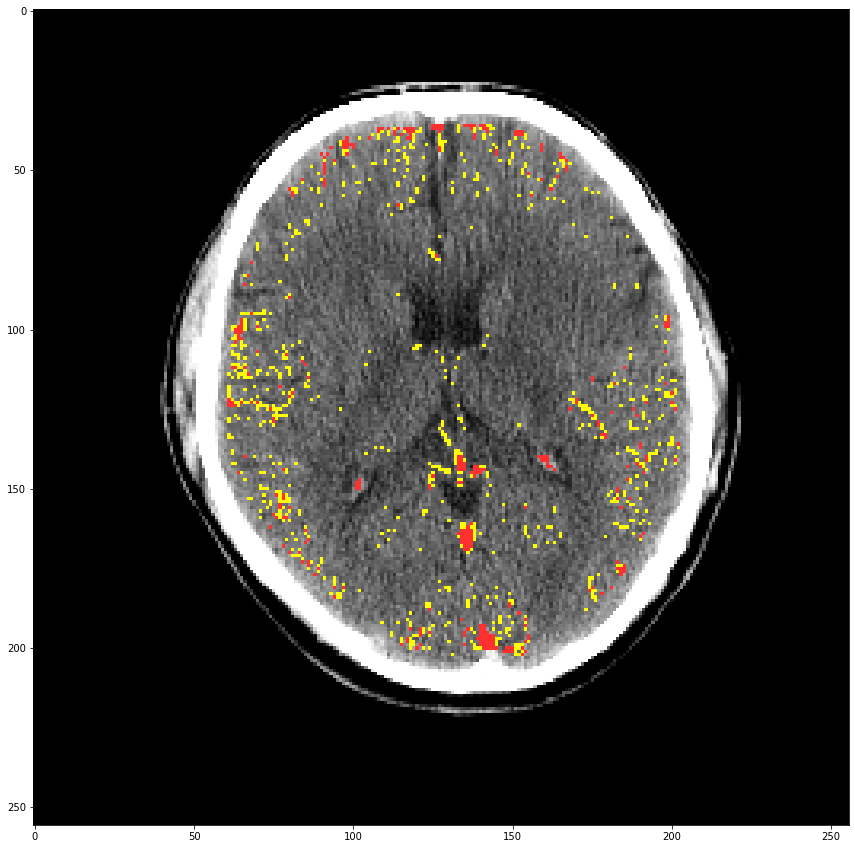

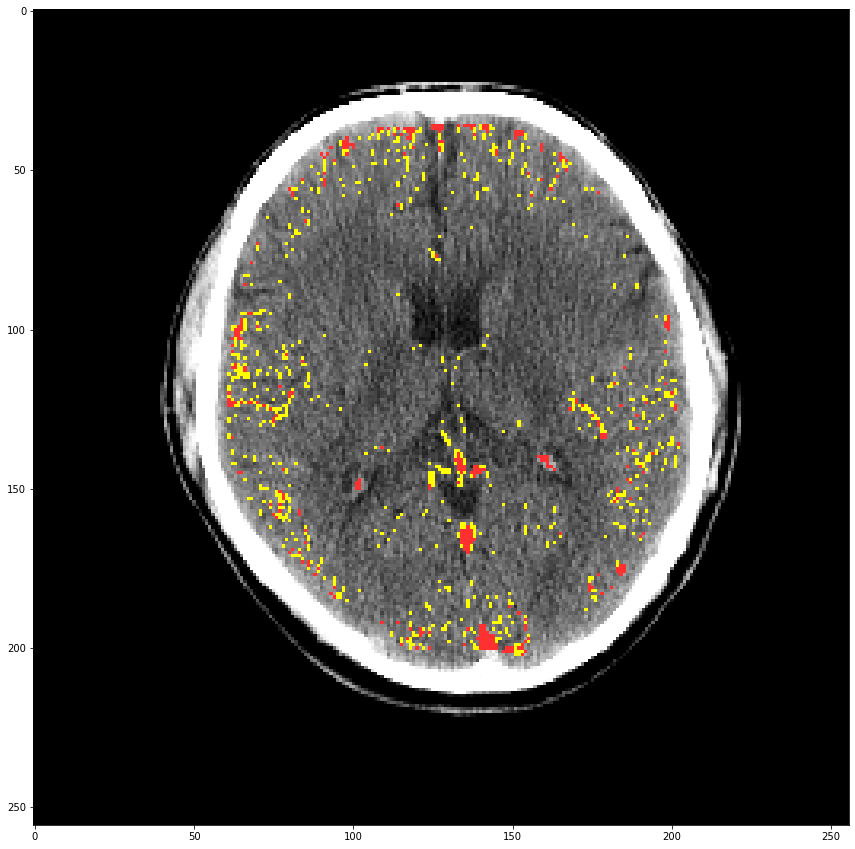

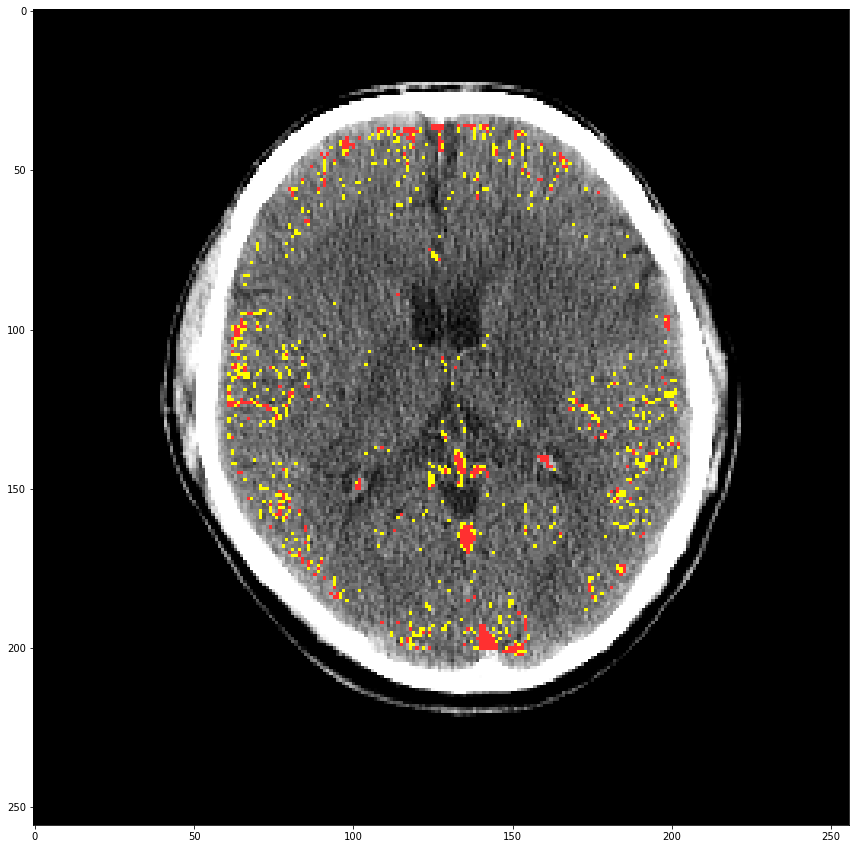

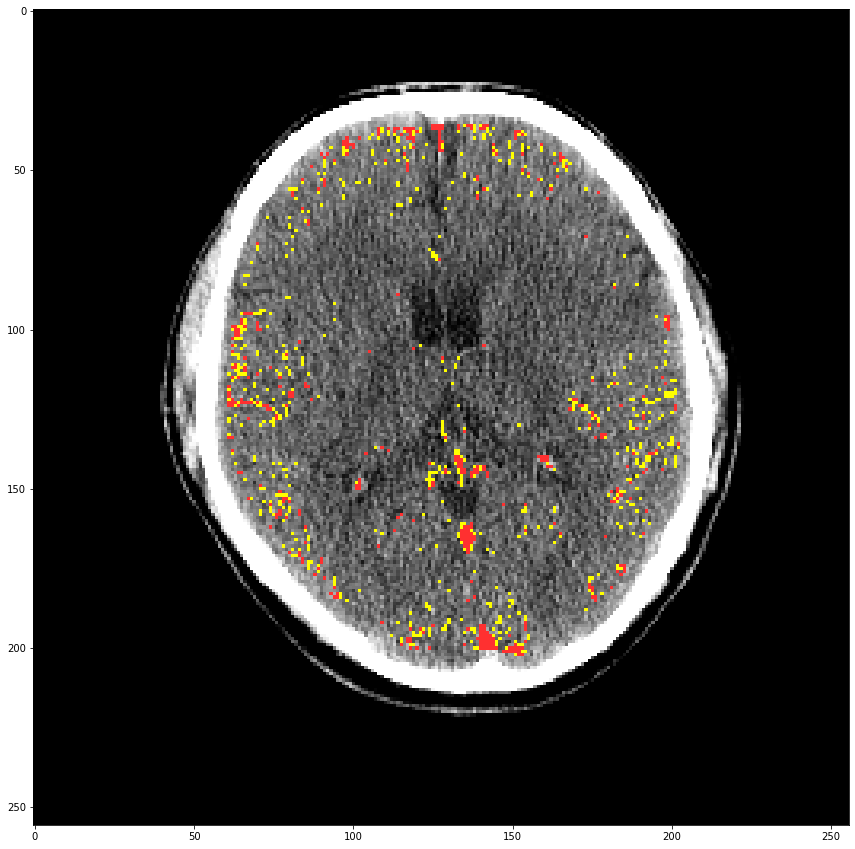

In [882]:
video = creatVideo(imgs, aif_threshold, vessel_threshold, vessel_mask)
for idx, pic in enumerate(video):
    plt.figure(figsize = (20, 15))
    plt.imshow(pic)
    plt.show()

In [883]:
saveVideo(video, global_all+'_Kmeans', '', timepoint, aif_mask)
global_all

'03_case_5_7'

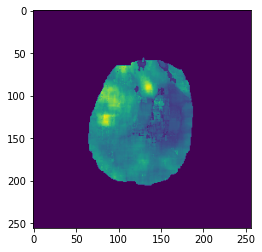

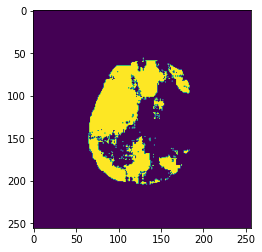

Time: 1s


In [907]:
# ------------------Conditions-------------------------
start = datetime.datetime.now()
vessel_mask, aif_mask, vessel_threshold, aif_threshold, timepoint = aifDetection_Condition(tissue_signal, imgs, mask)
end = datetime.datetime.now()
print('Time: {}s'.format((end - start).seconds))

(256, 256)


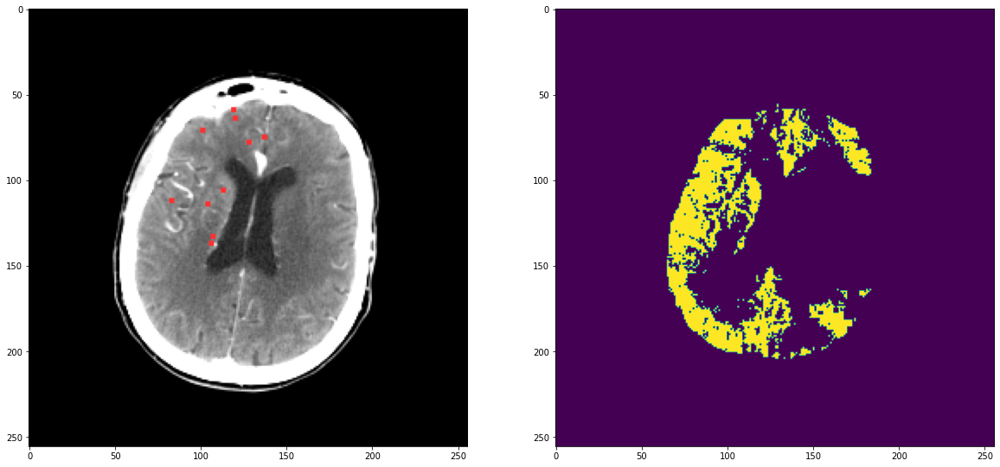

In [908]:
print(vel_location.shape)
plt.figure(figsize = (20, 15))
plt.subplot(1, 2, 1)
plt.imshow(RGBMapping(imgs[timepoint], aif_mask, aif_mask))
plt.subplot(1, 2, 2)
plt.imshow(vessel_mask)
plt.show()

In [721]:
video = creatVideo(imgs, aif_threshold + 0.1, vessel_threshold, vessel_mask)


0.641375612745098 0.5845122447319177


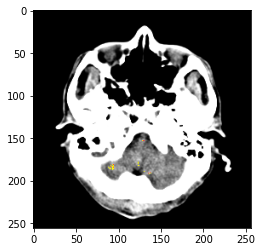

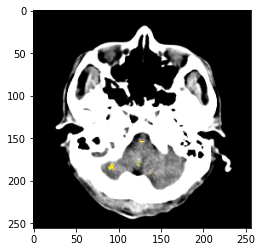

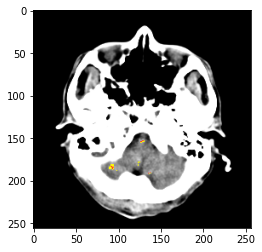

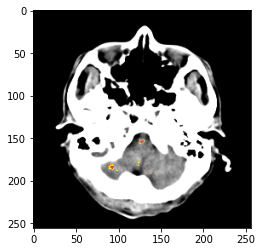

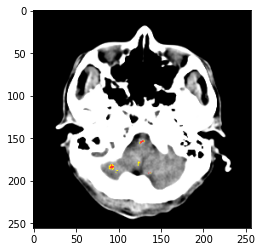

...

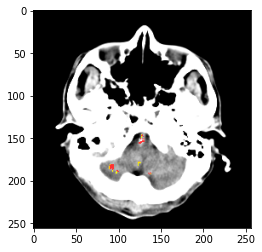

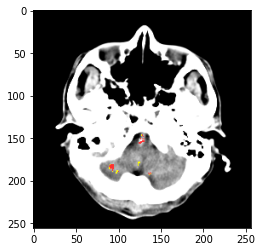

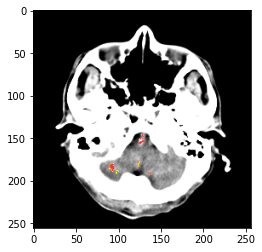

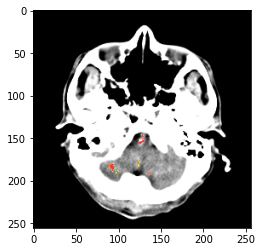

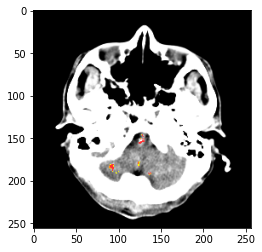

In [722]:
for pic in video:
    plt.figure()
    plt.imshow(pic)
    plt.show()

In [723]:
saveVideo(video, global_all + '_Condition', '', timepoint, aif_mask)
global_all

'49_case_80_1'

In [209]:
idx = np.where(aif_mask != 0)
signal = tissue_signal[idx]
signal.shape

(9, 49)

In [211]:
signal_avg = np.mean(signal, axis=0)
signal_avg

array([ 0.        ,  0.        ,  0.        ,  0.1446555 ,  0.07452548,
        0.16017117,  0.20996283,  0.2768723 ,  0.17728164,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  1.44963205,  3.86506458,  6.6437411 ,  9.6793654 ,
       12.61440174, 14.95283821, 16.14599387, 15.7495372 , 13.79832989,
       11.06553289,  8.6642812 ,  7.14075703,  6.02270753,  4.47226398,
        2.0918284 ,  0.25216756,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ])

In [224]:
tissue_signal.shape

(256, 256, 49)

In [260]:
while(1):
    random_idx = np.random.randint(256*256)
    y, x = random_idx // 256, random_idx % 256
    if mask[y, x] != 0:
        other = tissue_signal[y, x]
        break

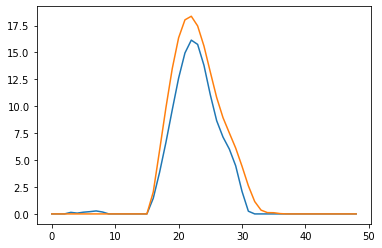

In [261]:
plt.figure()
plt.plot(signal_avg)
plt.plot(other)
plt.show()

In [156]:
def vessel_locating(param_map, mask):
    shape = Img_shape
    mask_idx = np.where(mask != 0)
    x_seq = param_map[mask_idx]
    predi = Kmeans(x_seq, cluster=2)
    label_map = predi.labels_
    bat = param_map[..., 0]
    mean_bat = modeNum(bat, mode='mean')
    label_idx = np.where(bat[mask != 0] < mean_bat)[:-1]
    label = np.argmax(np.bincount(label_map[label_idx]))
    fill = np.zeros_like(label_map)
    fill[np.where(label_map == label)] = 1
    location = np.zeros(shape)
    location[mask_idx] = fill
    return location

In [157]:
location = vessel_locating(param_map, mask)

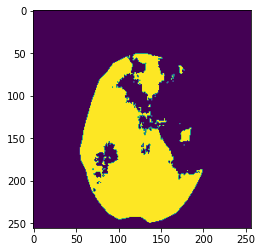

In [158]:
plt.figure()
plt.imshow(location)
plt.show()

In [147]:
np.sum(bat == param_map[..., 0], axis = 1)

array([[256, 256, 256, ..., 256, 256, 256],
       [256, 256, 256, ..., 256, 256, 256],
       [256, 256, 256, ..., 256, 256, 256],
       ...,
       [256, 256, 256, ..., 256, 256, 256],
       [256, 256, 256, ..., 256, 256, 256],
       [256, 256, 256, ..., 256, 256, 256]])

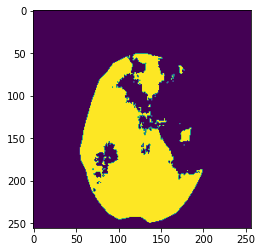

In [136]:
mask_idx = np.where(mask != 0)
x_seq = param_map[mask_idx]
predi = Kmeans(x_seq, cluster = 2)
label_map = predi.labels_
location = np.zeros((256, 256))
location[mask_idx] = label_map
plt.figure()
plt.imshow(location)
plt.show()

In [154]:
mean_bat = modeNum(bat, mode='mean')
label_idx = np.where(bat[mask != 0] < mean_bat)[:-1]
label_seq = label_map[label_idx]
lamfunc = lambda x : np.argmax(np.bincount(x).astype('int'))
lamfunc(label_seq)

1

vessel time: 15


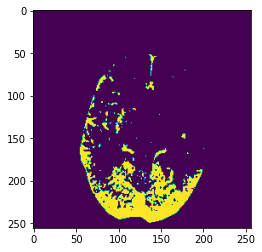

In [130]:
vessel_location = location
# idx = (modeNum(bat, mode='mode') + modeNum(ttp, mode='mode')) // 2
idx = modeNum(ttp, mode='mode')
print('vessel time:',idx)
Image = imgs[idx].copy() / 255
vessel_location_idx = np.where(vessel_location != 0)    
vessel_seq = Image[vessel_location_idx]
vessel_seq = np.expand_dims(vessel_seq, axis=0)
vessel_threshold = filters.threshold_otsu(vessel_seq)
vessel_mask = np.zeros_like(vessel_location)
vessel_fill = np.zeros_like(vessel_seq)
vessel_fill[np.where(vessel_seq > vessel_threshold)] = 1
vessel_mask[vessel_location_idx] = vessel_fill.squeeze(0)
plt.figure()
plt.imshow(vessel_mask)
plt.show()

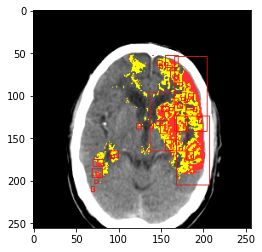

In [26]:
img = video[timepoint].copy()
img = add_box(img, aif_mask)
plt.figure()
plt.imshow(img)
plt.show()

In [243]:
videoWriter = cv2.VideoWriter('video.avi', cv2.VideoWriter_fourcc(*'MJPG'), 43, (256, 256))

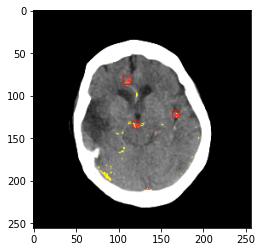

In [244]:
for i in range(len(video)):
    img = video[i]
    if i == timepoint:
        img = add_box(img, aif_mask)
        plt.figure()
        plt.imshow(img)
        plt.show()
    videoWriter.write(img)
videoWriter.release()

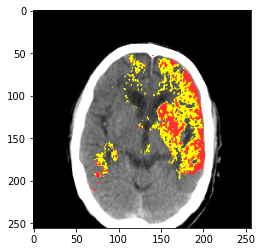

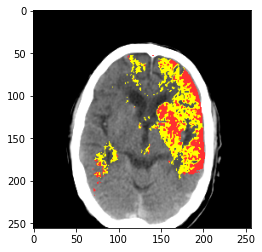

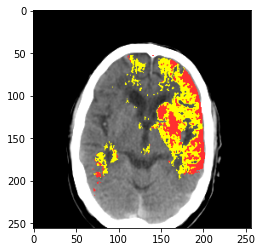

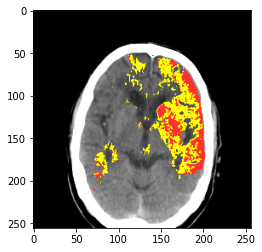

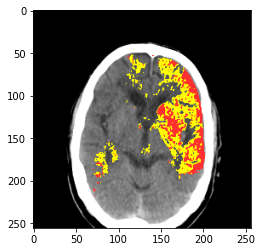

...

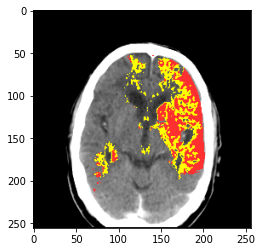

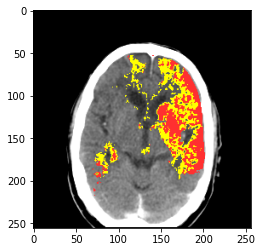

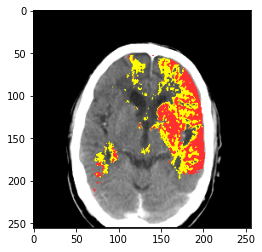

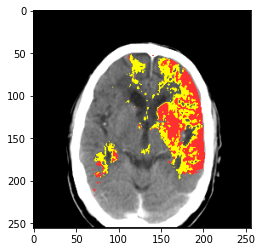

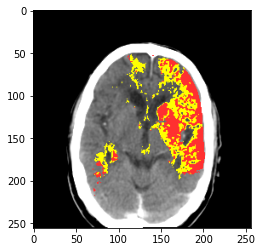

In [25]:
video = creatVideo(imgs, aif_threshold, vessel_threshold, vessel_location)
plt.figure()
for i in range(len(video)):
    plt.imshow(video[i])
    plt.show()

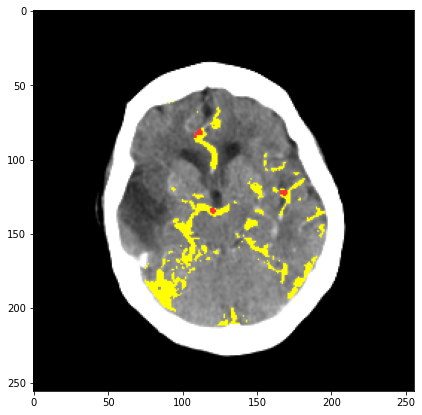

(256, 256, 3)


In [169]:
img = imgs[15].copy().astype('uint8')
rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
rgb[..., 0][vessel_mask == 1] = 255
rgb[..., 0][aif_mask == 1] = 255
rgb[..., 1][vessel_mask == 1] = 255
rgb[..., 1][aif_mask == 1] = 48
rgb[..., 2][vessel_mask == 1] = 0
rgb[..., 2][aif_mask == 1] = 48

plt.figure(figsize = (15, 7))
plt.imshow(rgb)
plt.show()
print(rgb.shape)

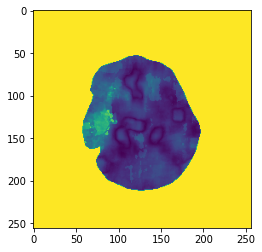

In [56]:
from einops import repeat, rearrange
center = predi.cluster_centers_[-1]
centerMat = repeat(center, 'f-> h w f', h = 256, w = 256)

dis_map = np.sum(np.sqrt(np.power(param_map - centerMat, 2)), axis=-1)
plt.figure()
plt.imshow(dis_map)
plt.show()

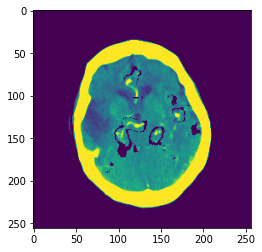

In [63]:
img = sys.images[14].copy()
img[np.where(dis_map < 5)] = 0
plt.figure()
plt.imshow(img)
plt.show()

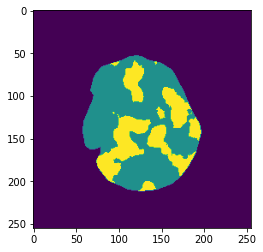

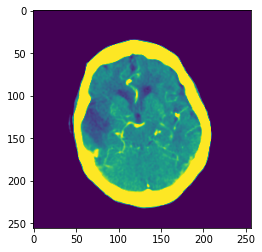

In [112]:
param_map = np.concatenate((bat, radius, cbf, ttp, end), axis=-1)
# param_map = 
index = np.where(mask == 255)
param_map_ = param_map[index]
predi = Kmeans(param_map_)
label_map = predi.labels_
mapping = np.zeros((255, 255))
mapping[index] = label_map+1
plt.figure()
plt.imshow(mapping)
plt.show()
plt.figure()
plt.imshow(sys.images[15])
plt.show()

In [119]:
predi.cluster_centers_.shape

(2, 5)

In [113]:
index = np.where(mapping==2.0)
param_map_ = param_map[index]
param_map_.shape
# otsu = filters.threshold_otsu(dist_map[dist_map > middle])

(5283, 5)

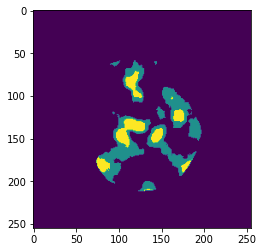

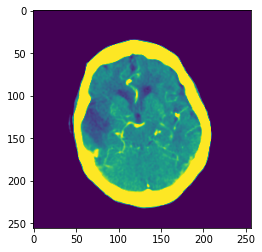

In [110]:
index = np.where(mapping == 2.0)
param_map_ = param_map[index]
predi = Kmeans(param_map_)
label_map = predi.labels_
mapping = np.zeros((255, 255))
mapping[index] = label_map+1
plt.figure()
plt.imshow(mapping)
plt.show()
plt.figure()
plt.imshow(sys.images[15])
plt.show()

In [50]:
starttime = datetime.datetime.now()
irf, cbf, _ = sys.obtain_irf(nWorkers = 2, method = sys.compute_irf)
# irf, cbf, conb = sys.obtain_tissue_tmax()
endtime = datetime.datetime.now()
print((endtime - starttime).seconds // 60)

100%|██████████| 16351/16351 [00:00<00:00, 299190.59it/s]


8


In [200]:
sys.show_R_signal()

AttributeError: 'AisSystem' object has no attribute 'aif_seq'

In [35]:
def show_signal(mat, tissue):
    size = len(mat)
    plt.figure(figsize = (15, 7))
    col_num = 8
    row_num = np.ceil(size / col_num)
    for i in range(size):
        plt.subplot(row_num, col_num, i+1)
        plt.plot(mat[i,:])
        plt.plot(tissue)
    plt.show()

In [43]:
def regulSig(cir_mat):
    size = cir_mat.shape[0]
#     peakposi = np.argmax(cir_mat[:,0])
    
    cir_mat = np.linalg.inv(cir_mat)
    peakposi = np.argmax(cir_mat[0,:])
    print(peakposi)
    
#     show_signal(cir_mat)
    for ii in range(size):
        head = cir_mat[ii][:ii]
        tail = cir_mat[ii][ii:]
        cir_mat[ii,:] = np.r_[tail, head]
    ans = cir_mat.mean(0)
    
    peaks, properties = find_peaks(ans, prominence = 0, width = [0, 2])
    print(peaks, properties)
    left_bases = properties['left_bases']
    right_bases = properties['right_bases']
    idex = np.argmax(ans[peaks])
    print('idex:', idex)
    print(left_bases[idex], right_bases[idex])
    
    left = left_bases[idex] if abs(left_bases[idex] - peakposi) < abs(right_bases[idex - 1] - peakposi) else right_bases[idex - 1]
    print('left:',abs(left_bases[idex] - peakposi), abs(right_bases[idex - 1] - peakposi))
    right = right_bases[idex] if abs(right_bases[idex] - peakposi) < abs(left_bases[idex + 1] - peakposi) else left_bases[idex + 1]
    print('right',abs(right_bases[idex] - peakposi),  abs(left_bases[idex + 1] - peakposi))
    
    leftpart = ans[:left]
    rightpart = ans[right:]
    print(left, right)
    midpart = ans[left : right]
    
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.plot(leftpart)
    plt.subplot(1, 3, 2)
    plt.plot(midpart)
    plt.subplot(1, 3, 3)
    plt.plot(rightpart)
    plt.show()
    leftpart = cv2.GaussianBlur(leftpart, (1, 3), 0.7)
    rightpart = cv2.GaussianBlur(rightpart, (1, 3), 0.7)
    ans = np.r_[leftpart.squeeze(-1), midpart, rightpart.squeeze(-1)]
    plt.figure()
    plt.subplot(1, 4, 1)
    plt.plot(leftpart)
    plt.subplot(1, 4, 2)
    plt.plot(midpart)
    plt.subplot(1, 4, 3)
    plt.plot(rightpart)
    plt.show()
    plt.figure()
    plt.plot(ans)
    plt.show()
    return circulant(ans).T

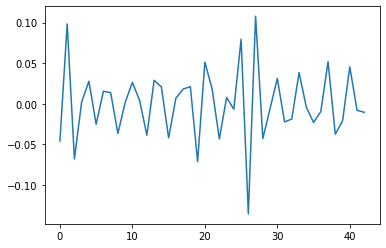

27
[ 1  4  6 20 23 25 27 30 33 37 40] {'prominences': array([0.14424908, 0.06649787, 0.04061429, 0.09459088, 0.01450091,
       0.15080735, 0.15070748, 0.05357074, 0.0614647 , 0.08927376,
       0.05600832]), 'left_bases': array([ 0,  2,  5, 19, 22, 19, 26, 28, 28, 28, 38]), 'right_bases': array([26, 12,  8, 22, 24, 26, 28, 31, 35, 38, 42]), 'widths': array([0.93381371, 1.73805369, 1.87009332, 1.61857784, 0.64211611,
       1.22493906, 0.80955217, 1.22233539, 1.26042592, 1.22729219,
       0.94512927]), 'width_heights': array([ 0.02625215, -0.00545994, -0.00486249,  0.00404841,  0.00052033,
        0.004102  ,  0.03247886,  0.00443099,  0.00772526,  0.0071927 ,
        0.01747705]), 'left_ips': array([ 0.5       ,  2.88977481,  5.5       , 19.61437288, 22.85788389,
       24.12561051, 26.69044783, 29.27766461, 32.46217439, 36.27270781,
       39.5794463 ]), 'right_ips': array([ 1.43381371,  4.6278285 ,  7.37009332, 21.23295072, 23.5       ,
       25.35054958, 27.5       , 30.5       ,

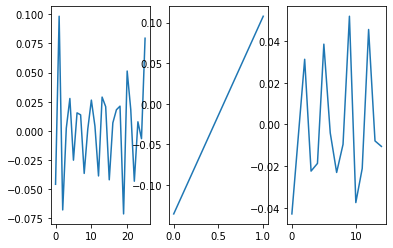

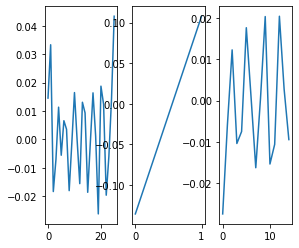

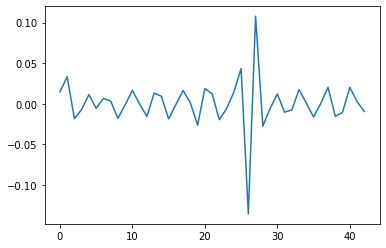

In [44]:
import cv2
aif = sys.final_signal_aif

cir_aif = circulant(aif)
plt.figure()
plt.plot(np.linalg.inv(cir_aif)[0])
plt.show()
cir_aif_inv = regulSig(cir_aif)

In [174]:
aif = sys.final_signal_aif
gamma = np.zeros_like(aif)
gamma[np.argmax(aif)] = max(aif)

13 13


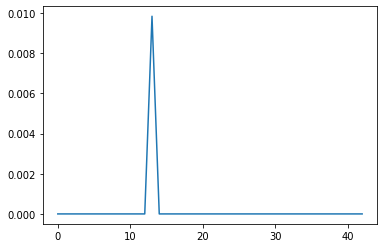

In [178]:
cir_gamma = circulant(gamma)
cir_gamma_inv = np.linalg.inv(cir_gamma)
print(np.argmax(cir_gamma_inv[0]), np.argmax(gamma))
plt.figure()
plt.plot(cir_gamma_inv[0])
plt.show()

In [51]:
from skimage import data, filters
from skimage import transform, exposure
irf_img = irf.copy()
cbf_img = cbf.copy() 
# cbv_img = cbv.copy()
brain_mask = sys.brain_mask

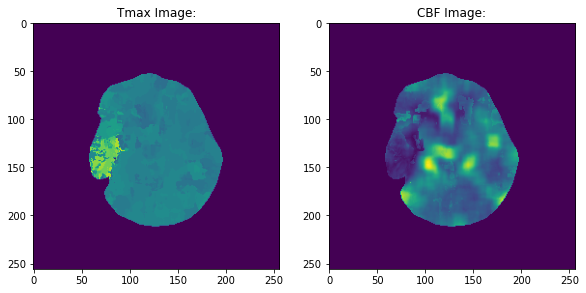

In [52]:
#21, 31, 01
plt.figure(figsize = (15, 7))
plt.subplot(1, 3, 1)
plt.imshow(irf_img)
plt.title('Tmax Image:')
plt.subplot(1, 3, 2)
plt.imshow(cbf_img)
plt.title('CBF Image:')
# plt.subplot(1, 3, 3)
# plt.imshow(cbv_img)
plt.show()

In [18]:
from skimage import data, filters
from skimage import transform, exposure
irf_img = irf.copy()
cbf_img = cbf.copy() 
# cbv_img = cbv.copy()
brain_mask = sys.brain_mask

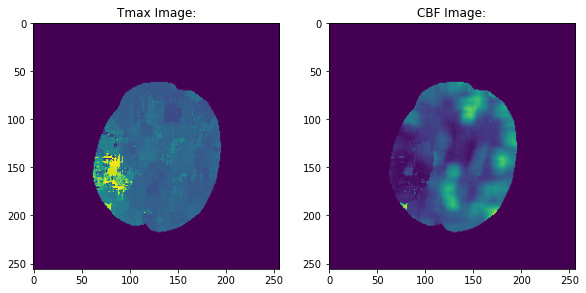

In [19]:
#21, 31, 01
plt.figure(figsize = (15, 7))
plt.subplot(1, 3, 1)
plt.imshow(irf_img)
plt.title('Tmax Image:')
plt.subplot(1, 3, 2)
plt.imshow(cbf_img)
plt.title('CBF Image:')
# plt.subplot(1, 3, 3)
# plt.imshow(cbv_img)
plt.show()

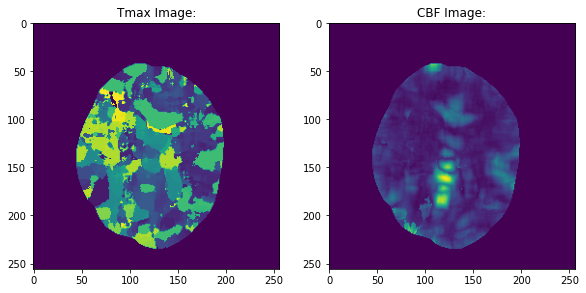

In [20]:
#22, 31, 01
plt.figure(figsize = (15, 7))
plt.subplot(1, 3, 1)
plt.imshow(irf_img)
plt.title('Tmax Image:')
plt.subplot(1, 3, 2)
plt.imshow(cbf_img)
plt.title('CBF Image:')
# plt.subplot(1, 3, 3)
# plt.imshow(cbv_img)
plt.show()

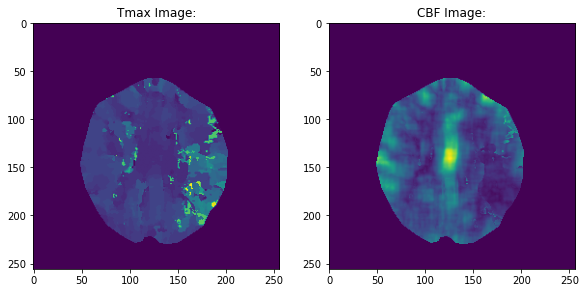

In [14]:
plt.figure(figsize = (15, 7))
plt.subplot(1, 3, 1)
plt.imshow(irf_img)
plt.title('Tmax Image:')
plt.subplot(1, 3, 2)
plt.imshow(cbf_img)
plt.title('CBF Image:')
# plt.subplot(1, 3, 3)
# plt.imshow(cbv_img)
plt.show()

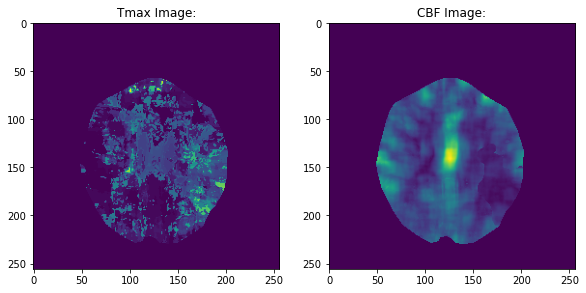

In [50]:
plt.figure(figsize = (15, 7))
plt.subplot(1, 3, 1)
plt.imshow(irf_img)
plt.title('Tmax Image:')
plt.subplot(1, 3, 2)
plt.imshow(cbf_img)
plt.title('CBF Image:')
# plt.subplot(1, 3, 3)
# plt.imshow(cbv_img)
plt.show()

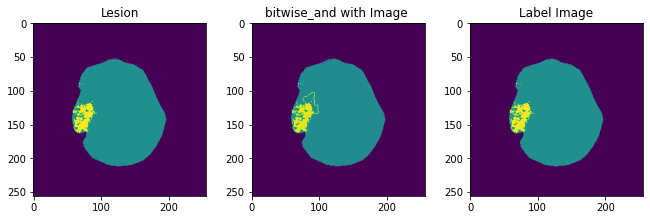

In [74]:
irf_label, res= postProcess(irf_img, sys.mask_contours, ptype = 'irf', n = 3)

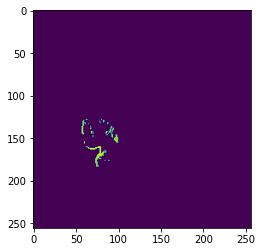

In [89]:
plt.imshow(res)

In [79]:
set(irf_img.flatten())

{0.0,
 18.65853658536585,
 24.878048780487806,
 43.53658536585366,
 49.75609756097561,
 80.85365853658537,
 87.07317073170732,
 93.29268292682927,
 99.51219512195122,
 105.73170731707316,
 111.95121951219512,
 118.17073170731707,
 124.39024390243902,
 130.609756097561,
 136.82926829268294,
 143.0487804878049,
 149.2682926829268,
 155.48780487804876,
 161.70731707317074,
 167.9268292682927,
 174.14634146341464,
 180.36585365853657,
 186.58536585365854,
 192.8048780487805,
 199.02439024390245,
 205.2439024390244,
 211.46341463414632,
 217.6829268292683,
 223.90243902439025,
 230.1219512195122,
 242.5609756097561,
 248.78048780487805,
 255.0}

In [70]:
set(res.ravel())
res[res == 1] = 0 

In [84]:
def get_center(img):
#     h, w = img.size()
    index = np.where(img != 0)
#     print(index)
    size = len(index)
    center_y = int(index[0].mean())
    center_x = int(index[1].mean())
    return (center_y, center_x)
y, x = get_center(res)
# x -= 10
# y -= 20

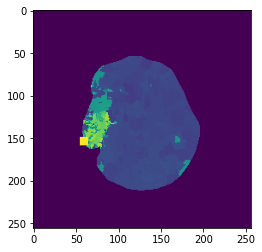

In [88]:
mat = irf_label.copy()
mat[y - 5 : y + 5, x - 5: x + 5] = 255
plt.imshow(mat)

In [87]:
index = np.argmax(irf_img)
y = int(index // 256)
x = int(index % 256)
y,x

(154, 60)

In [82]:
cv2.rectangle(mark, (max(0, x - 2), max(y - 2, 0)),(min(256, x + 2),min(256, y + 2)), (227,23,13), 1)
mark = cv2.drawContours(mark, sys.mask_contours, 0, (255, 0, 0), 1)

AttributeError: 'AisSystem' object has no attribute 'mark'

In [219]:
# mark = np.zeros_like(irf_label)
# index = np.argmax(irf_label)
# y = int(index // 256)
# x = int(index % 256)
# y,x

(88, 107)

242.3022705474293 0.24512773701319837 162.3022705474293


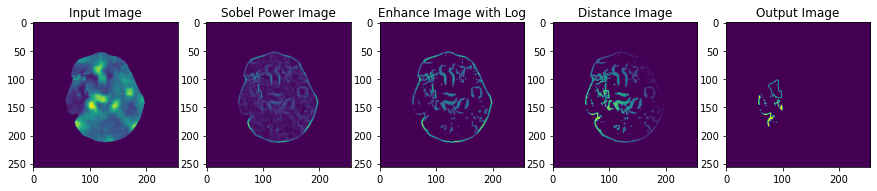

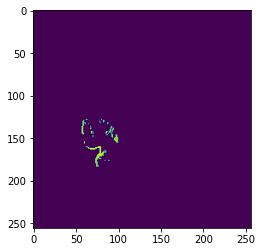

In [85]:
def extract_cbf(cbf_img, seed, brain_mask):
    '''
    Input:
        1.the cbf image getting from Ais-system
        2.seed is the location of maximal lesion value in irf image
        3.brain_mask is the main matter of brain
    Output:
        lesion core extracted from cbf image
    
    Describe:
        1. Enhence the contrast ratio of Input Image using Clahe.
        2. Calculate the power image at x and y directions, and conbine together.
        3. Enhencing the contrast ratio by expanding distribution between [0, 1] using log correction function, a * log(1 + x).
        4. Split the power image into two parts, basin and ridge, using otsu or cluster.
        5. Locating the target basin area through seed location, the ridge around target basin is contour of lesion in cbf image.
        6. Mapping pixel location into distance from seed location.
        7. Spliting brain into three parts, drop off the part farthest away from target area and select the part closest to seed location.
        
    '''
    h, w = cbf_img.shape
    x, y = seed
    aeh_img = exposure.equalize_adapthist(cbf_img / 255, kernel_size=None, clip_limit=0.01, nbins=256)
    sobel_x = cv2.Sobel(aeh_img, cv2.CV_64F, 1, 0, ksize = 3)
    sobel_y = cv2.Sobel(aeh_img, cv2.CV_64F, 0, 1, ksize = 3)
    sobel_xy = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
    
    brain_mask = sys.brain_mask
    log_img = exposure.adjust_log(sobel_xy)
    otsu = filters.threshold_otsu(log_img[brain_mask != 0])
    log_img[log_img < otsu] = 0

    def distance(x1, y1, x2, y2):
        return np.sqrt((x1 - x2) ** 2 + (y1 - y2) ** 2)
    
    dist_map = np.zeros((h, w))
    for row in range(h):
        for col in range(w):
            if log_img[row, col] == 0:
                continue
            dist_map[row, col] = distance(x, y, col, row)
    
    
    maxV = dist_map.max()
    minV = dist_map.min()
    dist_map[dist_map!=0] = maxV - dist_map[dist_map !=0 ] # pixel inversion
    
    dist_map = ((dist_map - minV) / (maxV - minV)) * 255
    res = dist_map.copy()
    
    maxV = dist_map.max()
    minV = dist_map[dist_map != 0].min()
    
    middle = maxV - 1 * (maxV - minV) // 3
    print(maxV, minV, middle)
    
    otsu = filters.threshold_otsu(dist_map[dist_map > middle])
    dist_map[dist_map < otsu] = 0
    
#     kernel = np.ones((2,2), 'uint8')
#     lesion_dilation = cv2.dilate(dist_map, kernel, iterations = 1)
#     lesion_erode = cv2.erode(lesion_dilation, kernel, iterations = 1)
#     lesion_dilation = cv2.dilate(lesion_erode, kernel, iterations = 1)
    
    
    
    ret,mask = cv2.threshold(dist_map, 127, 255, 0)
    mask = cv2.drawContours(mask, sys.mask_contours, 0, (255, 0, 0), 1)
#     cv2.rectangle(mask, (max(0, x - 2), max(y - 2, 0)), 
#                               (min(256, x + 2),min(256, y + 2)), (227,23,13), 1)
    
    plt.figure(figsize = (15, 7))
    plt.subplot(1, 5, 1)
    plt.imshow(cbf_img)
    plt.title('Input Image')
    plt.subplot(1, 5, 2)
    plt.imshow(sobel_xy)
    plt.title('Sobel Power Image')
    plt.subplot(1, 5, 3)
    plt.imshow(log_img)
    plt.title('Enhance Image with Log')
    plt.subplot(1, 5, 4)
    plt.imshow(res)
    plt.title('Distance Image')
    plt.subplot(1, 5, 5)
    plt.imshow(mask)
    plt.title('Output Image')
    plt.show()
    
    return dist_map

res = extract_cbf(cbf_img, (x, y), brain_mask = sys.brain_mask)
plt.imshow(res)

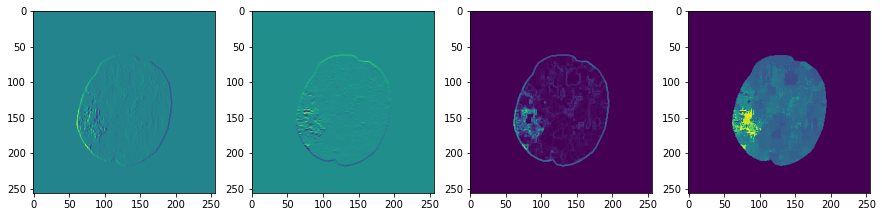

In [22]:
h, w = irf_img.shape

aeh_img = exposure.equalize_adapthist(irf_img / 255, kernel_size=None, clip_limit=0.01, nbins=256)
sobel_x = cv2.Sobel(aeh_img, cv2.CV_64F, 1, 0, ksize = 3)
sobel_y = cv2.Sobel(aeh_img, cv2.CV_64F, 0, 1, ksize = 3)
sobel_xy = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
plt.figure(figsize = (15, 7))
plt.subplot(1, 4, 1)
plt.imshow(sobel_x)
plt.subplot(1, 4, 2)
plt.imshow(sobel_y)
plt.subplot(1, 4, 3)
plt.imshow(sobel_xy)
plt.subplot(1, 4, 4)
plt.imshow(aeh_img)
plt.show()


In [61]:
irf_img.shape, cbf_img.shape

((256, 256), (256, 256))

In [63]:
input_img = np.stack((irf_img, cbf_img), axis = 0)

In [64]:
input_img.shape

(2, 256, 256)

In [68]:
input_img = input_img.reshape((256, 256, 2))

In [95]:
seq =input_img.reshape(-1, 2)
predi = kmeans(n_clusters = 4, init = 'k-means++', n_jobs = -1).fit(seq)
label_img = predi.labels_

In [96]:
label_img.resize((256, 256, 1))
label_img.shape

(256, 256, 1)

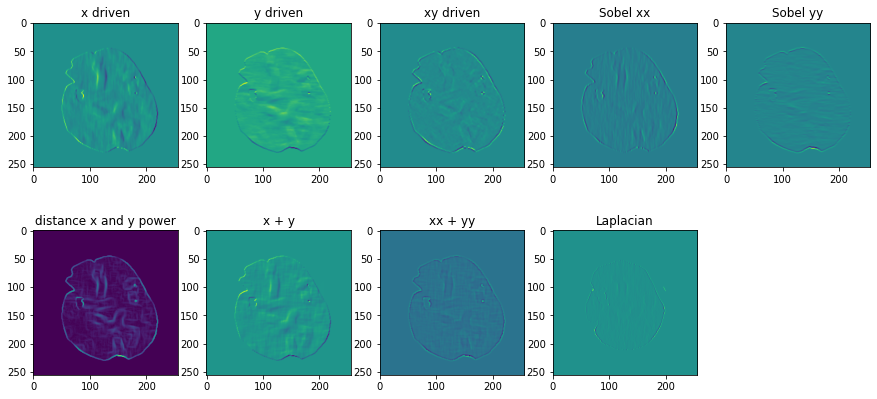

In [223]:
#Hession Detector

sobel_x = cv2.Sobel(aeh_img, cv2.CV_64F, 1, 0, ksize = 3)
sobel_y = cv2.Sobel(aeh_img, cv2.CV_64F, 0, 1, ksize = 3)
sobel_xy = cv2.Sobel(sobel_x, cv2.CV_64F, 0, 1, ksize = 3)
sobel_yy = cv2.Sobel(sobel_y, cv2.CV_64F, 0, 1, ksize = 3)
sobel_xx = cv2.Sobel(sobel_x, cv2.CV_64F, 1, 0, ksize = 3)
matter = img[brain_mask == 255]
matter_xy = cv2.Laplacian(matter, cv2.CV_64F)
lap = img.copy()
lap[brain_mask == 255] = matter_xy.ravel()

sobel_2xy = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
plt.figure(figsize = (15, 7))
plt.subplot(2, 5, 1)
plt.imshow(sobel_x)
plt.title('x driven')
plt.subplot(2, 5, 2)
plt.imshow(sobel_y)
plt.title('y driven')
plt.subplot(2, 5, 3)
plt.imshow(sobel_xy)
plt.title('xy driven')
plt.subplot(2, 5, 4)
plt.imshow(sobel_xx)
plt.title('Sobel xx')
plt.subplot(2, 5, 5)
plt.imshow(sobel_yy)
plt.title('Sobel yy')
plt.subplot(2, 5, 6)
plt.imshow(sobel_2xy)
plt.title('distance x and y power')
plt.subplot(2, 5, 7)
plt.imshow(sobel_x + sobel_y)
plt.title('x + y')
plt.subplot(2, 5, 8)
plt.imshow(sobel_xx + sobel_yy)
plt.title('xx + yy')
plt.subplot(2, 5, 9)
plt.imshow(lap)
plt.title('Laplacian')
plt.show()

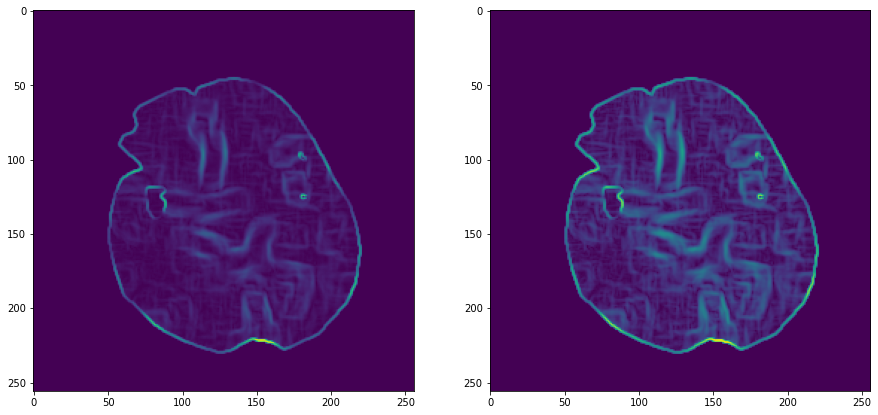

In [224]:
img = sobel_2xy
plt.figure(figsize = (15, 7))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.subplot(1, 2, 2)
plt.imshow(exposure.adjust_log(img))

In [225]:
brain_mask = sys.brain_mask
log_img = exposure.adjust_log(img)
otsu = filters.threshold_otsu(log_img[brain_mask != 0])
otsu

0.5092567907465309

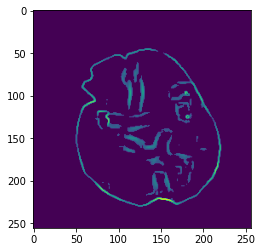

In [226]:
# img = res.copy()
log_img[img < otsu] = 0
plt.imshow(log_img)

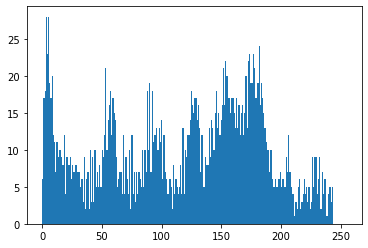

In [134]:
plt.hist(res[res != 0].ravel(), 256, [0, 255])
plt.show()

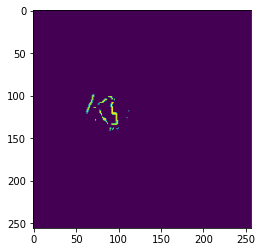

In [135]:
show_img = res.copy()
show_img[show_img < otsu] = 0
plt.imshow(show_img)

In [34]:
ret, img_mask = cv2.threshold(show_img, 127, 255, cv2.THRESH_BINARY)